# Import Libraries

In [1]:
#Code Block 1

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport

from sklearn import preprocessing

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

pd.set_option('display.max_columns',500) 

plt.style.use('seaborn-colorblind') #a style that can be used for plots

sns.set_style('whitegrid')

# Import Data

In [2]:
#Code Block 2

heart = pd.read_csv('data/heart_failure_clinical_records_dataset.csv.xls', index_col = None, header = 0)
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [3]:
#Code Block 3

heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


# Exploring the Data

In [4]:
#Code Block 4

heart.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.000000,299.00000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,136.625418,0.648829,0.32107,130.260870,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,4.412477,0.478136,0.46767,77.614208,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,113.000000,0.000000,0.00000,4.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,134.000000,0.000000,0.00000,73.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,137.000000,1.000000,0.00000,115.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,140.000000,1.000000,1.00000,203.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,148.000000,1.000000,1.00000,285.000000,1.00000


In [5]:
#Code Block 5

profile = ProfileReport(heart)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
#Code Block 6

heart['time'].sort_values().value_counts()
#see vlue counts for time

250    7
187    7
10     6
186    6
107    6
      ..
97     1
96     1
86     1
77     1
285    1
Name: time, Length: 148, dtype: int64

In [7]:
#Code Block 7

heart['sex'].value_counts()
#to see how many women and men we have in our dataset (1 for men and 0 for women)

1    194
0    105
Name: sex, dtype: int64

In [8]:
#Code Block 8

heart['age'].value_counts()
#to see age value counts

60.000    33
50.000    27
65.000    26
70.000    25
45.000    19
55.000    17
75.000    11
53.000    10
58.000    10
63.000     8
80.000     7
72.000     7
40.000     7
42.000     7
85.000     6
68.000     5
52.000     5
62.000     5
51.000     4
59.000     4
61.000     4
73.000     4
49.000     4
69.000     3
46.000     3
64.000     3
82.000     3
90.000     3
78.000     2
60.667     2
54.000     2
77.000     2
57.000     2
66.000     2
44.000     2
67.000     2
95.000     2
48.000     2
43.000     1
86.000     1
81.000     1
79.000     1
41.000     1
94.000     1
87.000     1
47.000     1
56.000     1
Name: age, dtype: int64

In [9]:
#Code Block 9

(heart["serum_creatinine"] > 2).value_counts()
#to see value counts for serum_creatinine greater than 2 as 2 is above normal level

False    265
True      34
Name: serum_creatinine, dtype: int64

In [10]:
#Code Block 10

serum_creatinin = heart[heart["serum_creatinine"] > 2]
#create a dataframe for serum_xreatinine above 2
serum_creatinin['DEATH_EVENT'].value_counts()
#to see how many death happened for patients with high level of serum_creatinine

1    21
0    13
Name: DEATH_EVENT, dtype: int64

### See how many patients died and how many are men or female 

In [11]:
#Code Block 11

heart['DEATH_EVENT'].value_counts()

0    203
1     96
Name: DEATH_EVENT, dtype: int64

In [12]:
#Code Block 12

heart[heart['DEATH_EVENT'] == 1].value_counts('sex')

sex
1    62
0    34
dtype: int64

### See how many patients smoked

In [13]:
#Code Block 13

heart['smoking'].value_counts()

0    203
1     96
Name: smoking, dtype: int64

### See how many smoked patients are men and how many are female
- create a dataframe for smoked patients 

In [14]:
#Code Block 14

smoke = heart[heart['smoking'] == 1]
#create a dataframe for smoked patients 
smoke['sex'].value_counts()
#to see the number of smoked men and women

1    92
0     4
Name: sex, dtype: int64

### See how many of smoked patients died 

In [15]:
#Code Block 15

smoke['DEATH_EVENT'].value_counts()

0    66
1    30
Name: DEATH_EVENT, dtype: int64

### See how many of smoked patients who died are men and how many are female

In [16]:
#Code Block 16

smoke[smoke['sex'] == 0].value_counts('DEATH_EVENT')
#number of death for smoked female patients 

DEATH_EVENT
1    3
0    1
dtype: int64

In [17]:
#Code Block 17

smoke[smoke['sex'] == 1].value_counts('DEATH_EVENT')
#number of death for smoked male patients 

DEATH_EVENT
0    65
1    27
dtype: int64

In [18]:
#Code Block 17

women_smoke = smoke[smoke['sex'] == 0]
#dataframe for women who smoked 

### Detect the outliers by visualizing with boxplot 

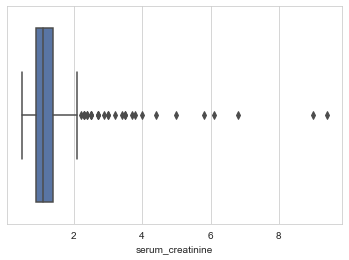

In [19]:
#Code Block 18

chart = sns.boxplot(x = "serum_creatinine",  data = heart, palette = 'deep')

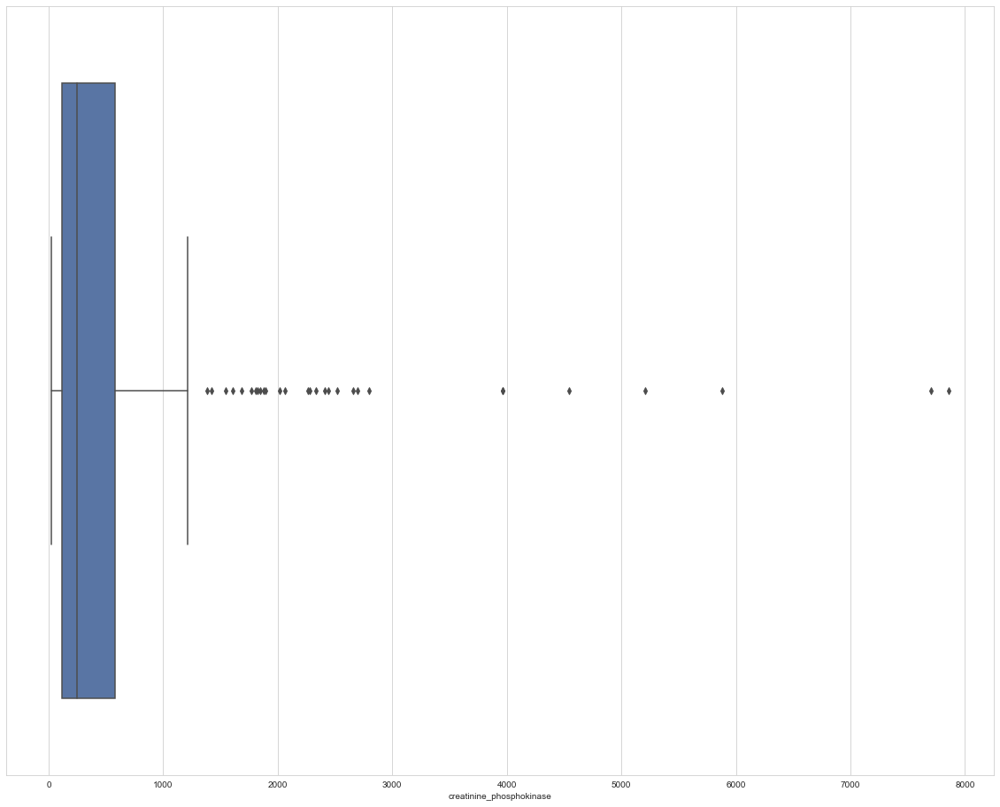

In [20]:
#Code Block 19

plt.figure(figsize = (20,16))

chart = sns.boxplot(x = "creatinine_phosphokinase",  data = heart, palette = 'deep')


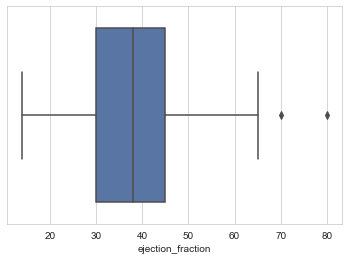

In [21]:
#Code Block 20

chart = sns.boxplot(x = "ejection_fraction",  data = heart, palette = 'deep')

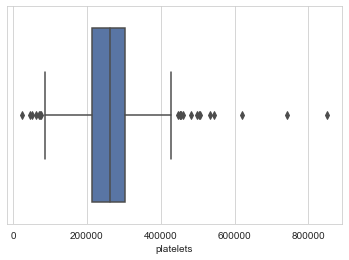

In [22]:
#Code Block 21

chart = sns.boxplot(x = "platelets",  data = heart, palette = 'deep')

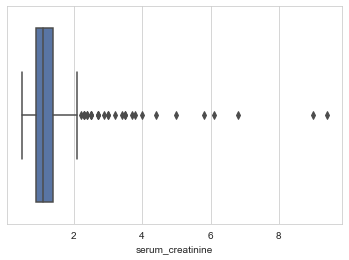

In [23]:
#Code Block 22

chart = sns.boxplot(x = "serum_creatinine",  data = heart, palette = 'deep')

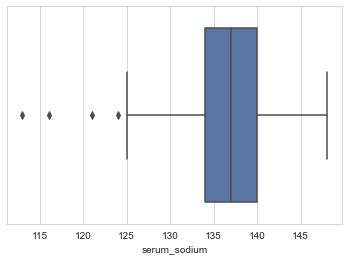

In [24]:
#Code Block 23
chart = sns.boxplot(x = "serum_sodium",  data = heart, palette = 'deep')

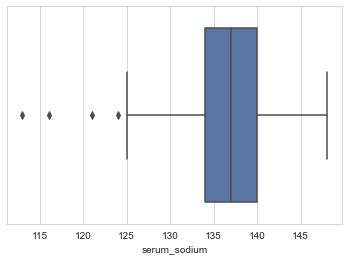

In [25]:
#Code Block 24

chart = sns.boxplot(x = "serum_sodium",  data = heart, palette = 'deep')

## Cleansing the Data

- Check the dataset for any duplication
- Check for any missng value and null values
- Drop time column as it doesn't have effect on DETH_EVENT we remove it from the dataset

In [26]:
#Code Block 25

heart.duplicated().value_counts()

False    299
dtype: int64

# Visualize the Data

<AxesSubplot:ylabel='sex'>

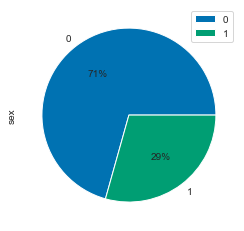

In [27]:
#Code Block 26

smoke.groupby(['DEATH_EVENT']).sum().plot(kind = 'pie', y = 'sex', autopct='%1.0f%%')
#pie chart for all death event for smoked patients(0 for female and 1 for male)

In [28]:
#Code Block 27

heart.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [30]:
#Code Block 28

heart[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'high_blood_pressure',
       'serum_creatinine','sex', 'smoking', 'DEATH_EVENT']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,high_blood_pressure,serum_creatinine,sex,smoking,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.00000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,0.351171,1.39388,0.648829,0.32107,0.32107
std,11.894809,0.496107,970.287881,0.494067,0.478136,1.03451,0.478136,0.46767,0.46767
min,40.000000,0.000000,23.000000,0.000000,0.000000,0.50000,0.000000,0.00000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,0.000000,0.90000,0.000000,0.00000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,0.000000,1.10000,1.000000,0.00000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,1.000000,1.40000,1.000000,1.00000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,1.000000,9.40000,1.000000,1.00000,1.00000


<AxesSubplot:ylabel='sex'>

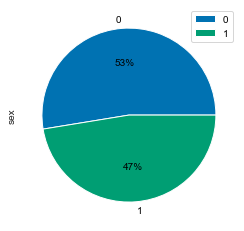

In [218]:
#Code Block 29

heart.groupby(['smoking']).sum().plot(kind = 'pie', y = 'sex', autopct='%1.0f%%')

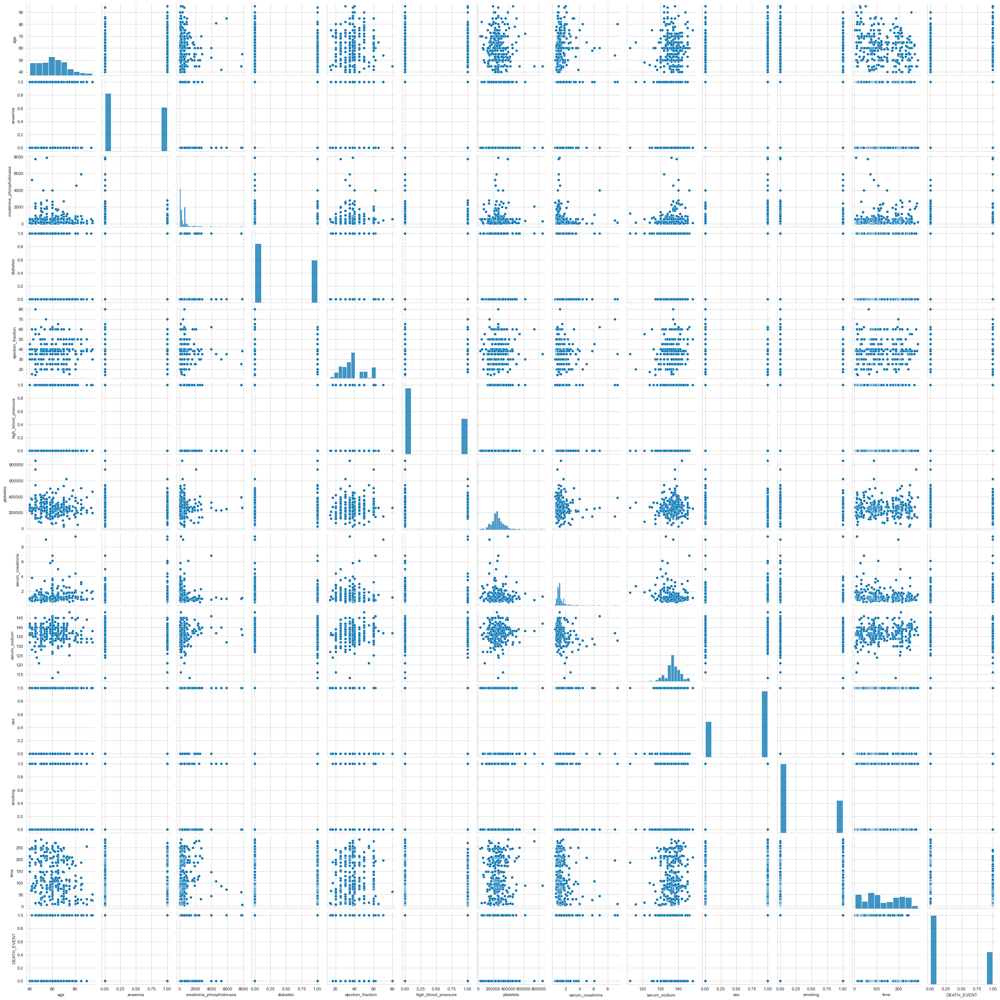

In [32]:
#Code Block 30

sns.pairplot(heart)

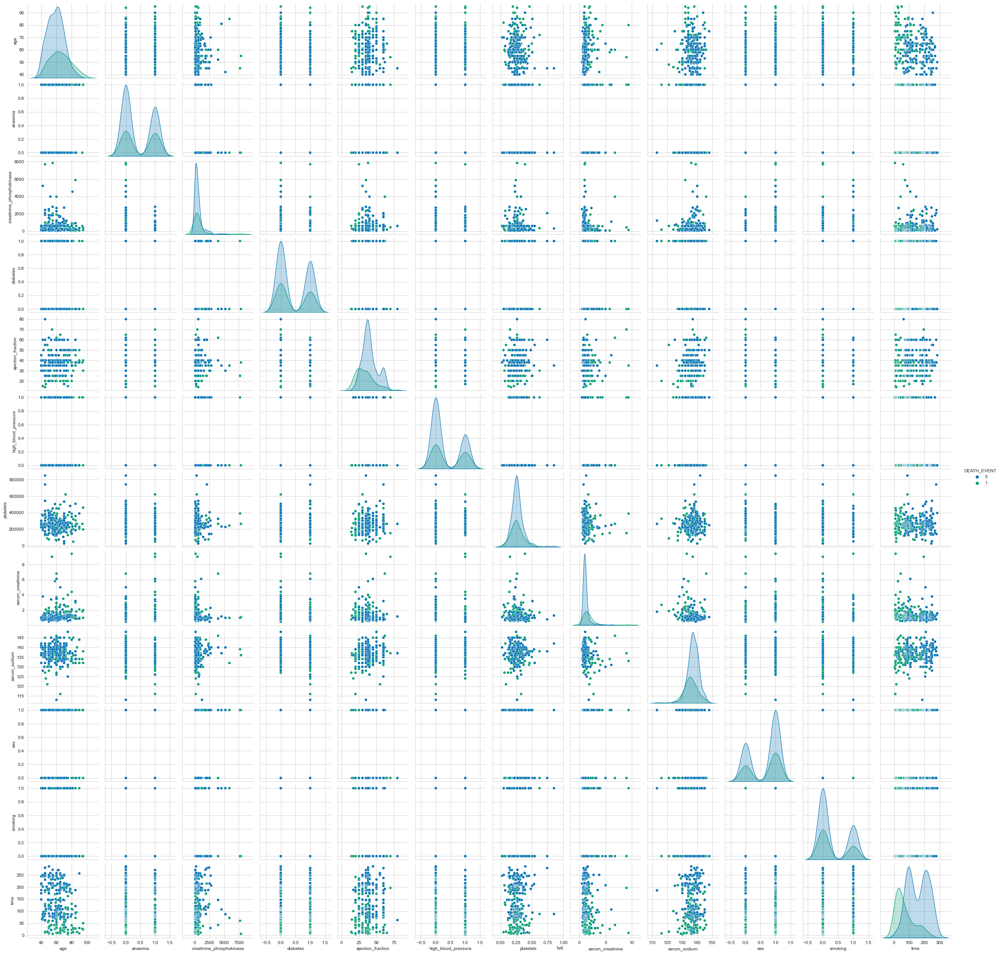

In [33]:
#Code Block 31

sns.pairplot(heart, hue ='DEATH_EVENT')

Text(0.5, 1.0, 'Correlation Heatmap')

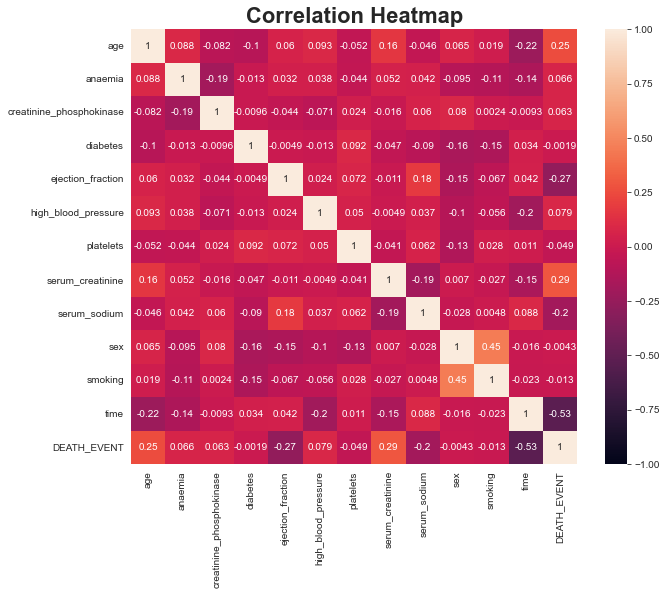

In [34]:
#Code Block 32

plt.figure(figsize = (10,8))

heatmap = sns.heatmap(heart.corr(), vmin=-1, vmax=1, annot=True)
plt.title('Correlation Heatmap',fontweight='bold', fontsize='22', horizontalalignment='center')

Text(0.5, 1.0, 'Features Correlation with DEATH_EVENT')

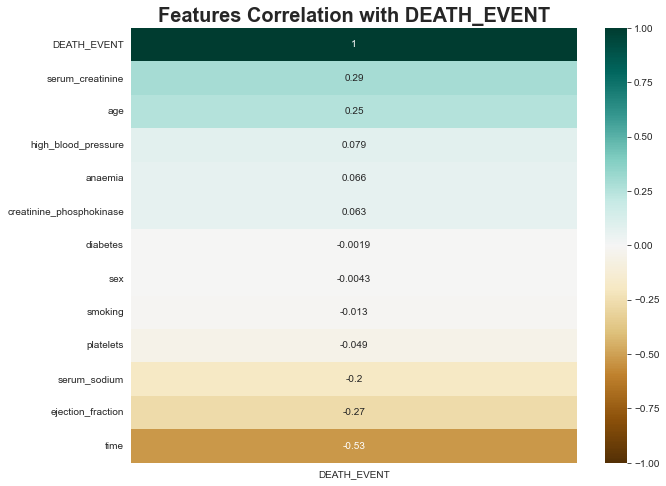

In [35]:
#Code Block 33

plt.figure(figsize = (10,8))

heatmap = sns.heatmap(heart.corr()[['DEATH_EVENT']].sort_values(by='DEATH_EVENT', ascending=False),
                      vmin=-1, vmax=1, annot=True, cmap='BrBG')
plt.title('Features Correlation with DEATH_EVENT',fontweight='bold', fontsize='20', horizontalalignment='center')

In [36]:
#Code Block 34

women = heart[heart['sex'] == 0]
men =  heart[heart['sex'] == 1]
women.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 105 entries, 4 to 296
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       105 non-null    float64
 1   anaemia                   105 non-null    int64  
 2   creatinine_phosphokinase  105 non-null    int64  
 3   diabetes                  105 non-null    int64  
 4   ejection_fraction         105 non-null    int64  
 5   high_blood_pressure       105 non-null    int64  
 6   platelets                 105 non-null    float64
 7   serum_creatinine          105 non-null    float64
 8   serum_sodium              105 non-null    int64  
 9   sex                       105 non-null    int64  
 10  smoking                   105 non-null    int64  
 11  time                      105 non-null    int64  
 12  DEATH_EVENT               105 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 11.5 KB


Text(0.5, 1.0, 'Features Correlation with DEATH_EVENT for Women')

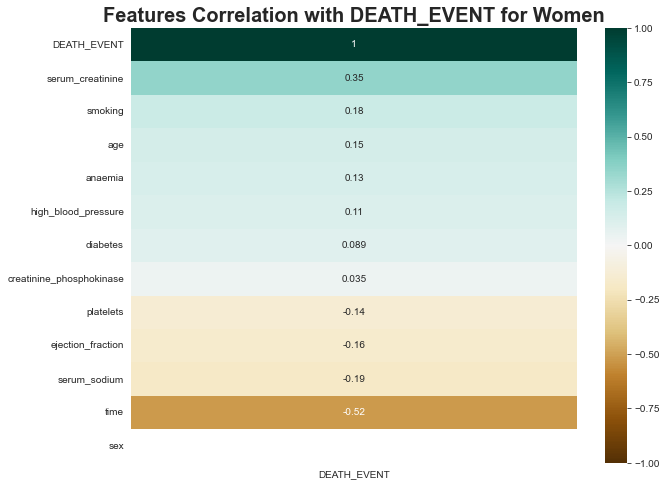

In [37]:
#Code Block 35

plt.figure(figsize = (10,8))

heatmap = sns.heatmap(women.corr()[['DEATH_EVENT']].sort_values(by='DEATH_EVENT', ascending=False),
                      vmin=-1, vmax=1, annot=True, cmap='BrBG')
plt.title('Features Correlation with DEATH_EVENT for Women',fontweight='bold', fontsize='20', horizontalalignment='center')

Text(0.5, 1.0, 'Features Correlation with DEATH_EVENT for Men')

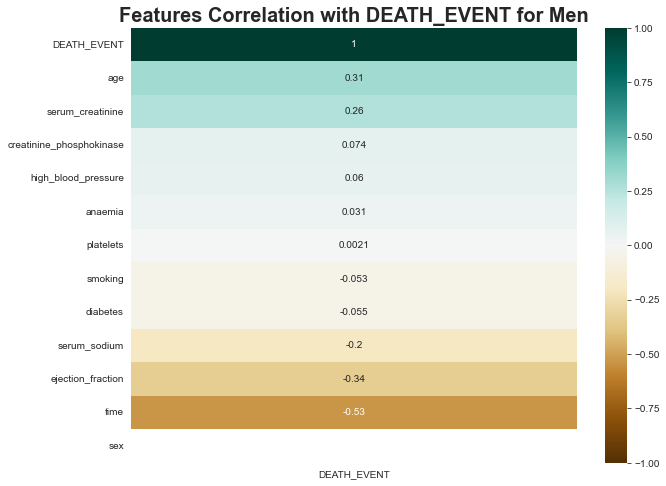

In [38]:
#Code Block 36 

plt.figure(figsize = (10,8))

heatmap = sns.heatmap(men.corr()[['DEATH_EVENT']].sort_values(by='DEATH_EVENT', ascending=False),
                      vmin=-1, vmax=1, annot=True, cmap='BrBG')
plt.title('Features Correlation with DEATH_EVENT for Men',fontweight='bold', fontsize='20', horizontalalignment='center')

<AxesSubplot:ylabel='DEATH_EVENT'>

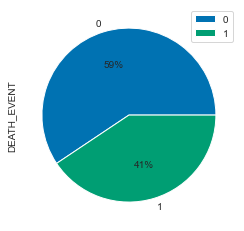

In [39]:
#Code Block 37

heart.groupby(['high_blood_pressure']).sum().plot(kind = 'pie', y = 'DEATH_EVENT', autopct='%1.0f%%')

Text(0.5, 1.0, 'Count of Age based on DEATH_EVENT')

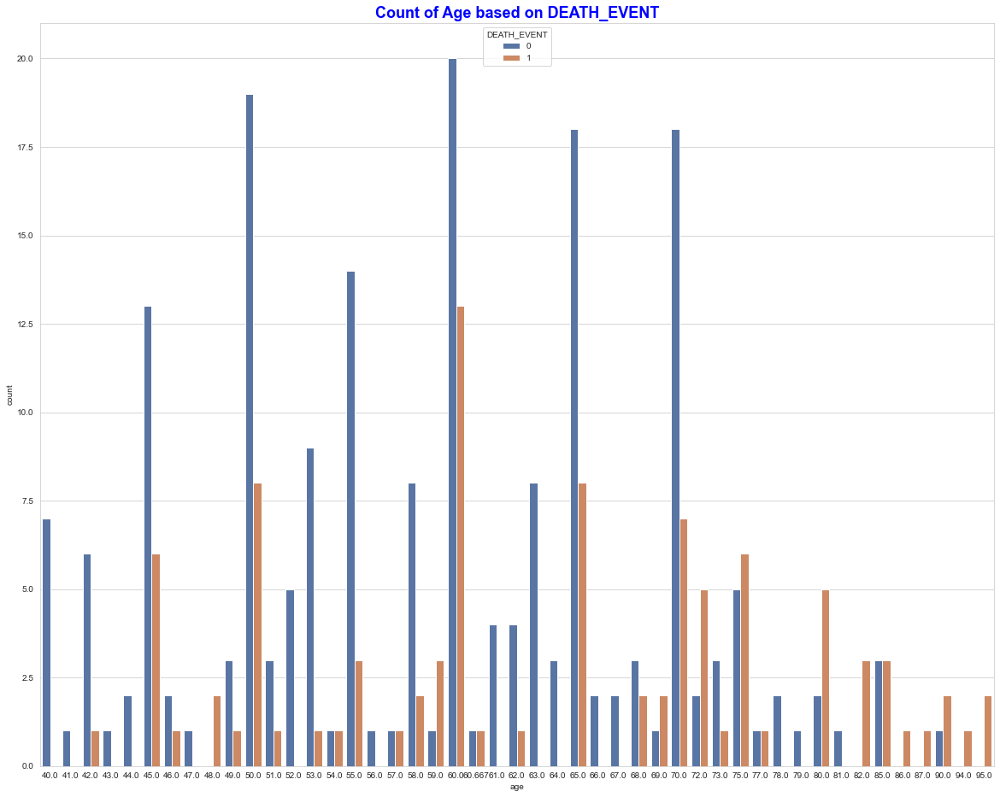

In [40]:
#Code Block 38

plt.figure(figsize = (20,16))

sns.countplot(x = "age", data = heart, hue = 'DEATH_EVENT', palette = 'deep')
plt.title('Count of Age based on DEATH_EVENT', fontweight='bold', color = 'blue', fontsize='18', horizontalalignment='center')

In [41]:
#Code Block 39

(heart['age'] > 70).value_counts()

False    247
True      52
Name: age, dtype: int64

In [42]:
#Code Block 40

heart[heart['DEATH_EVENT'] == 1].value_counts('age')
#see the value counts for age for dead patients

age
60.000    13
65.000     8
50.000     8
70.000     7
45.000     6
75.000     6
80.000     5
72.000     5
85.000     3
82.000     3
55.000     3
59.000     3
90.000     2
69.000     2
68.000     2
95.000     2
58.000     2
48.000     2
62.000     1
60.667     1
57.000     1
54.000     1
73.000     1
53.000     1
77.000     1
51.000     1
49.000     1
86.000     1
87.000     1
46.000     1
94.000     1
42.000     1
dtype: int64

Text(0.5, 0, 'Age')

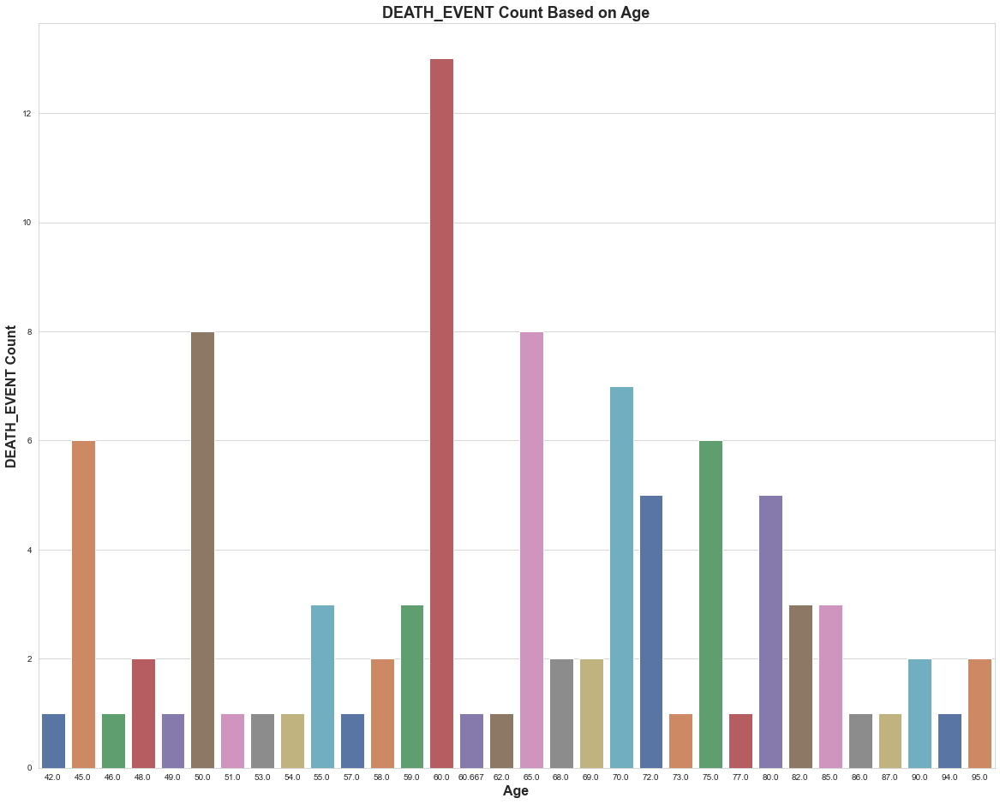

In [43]:
#Code Block 41

death = heart[heart['DEATH_EVENT'] == 1]
plt.figure(figsize = (20,16))

sns.countplot(x = "age",  data = death, palette = 'deep')
plt.title('DEATH_EVENT Count Based on Age',fontweight='bold', fontsize='18', horizontalalignment='center')
plt.ylabel('DEATH_EVENT Count',fontweight='bold', fontsize='16', horizontalalignment='center')
plt.xlabel('Age',fontweight='bold', fontsize='16', horizontalalignment='center')

In [45]:
#Code Block 42

age70 = death[death['age'] >= 70]
age70.value_counts('age').sum()

38

<AxesSubplot:xlabel='age', ylabel='count'>

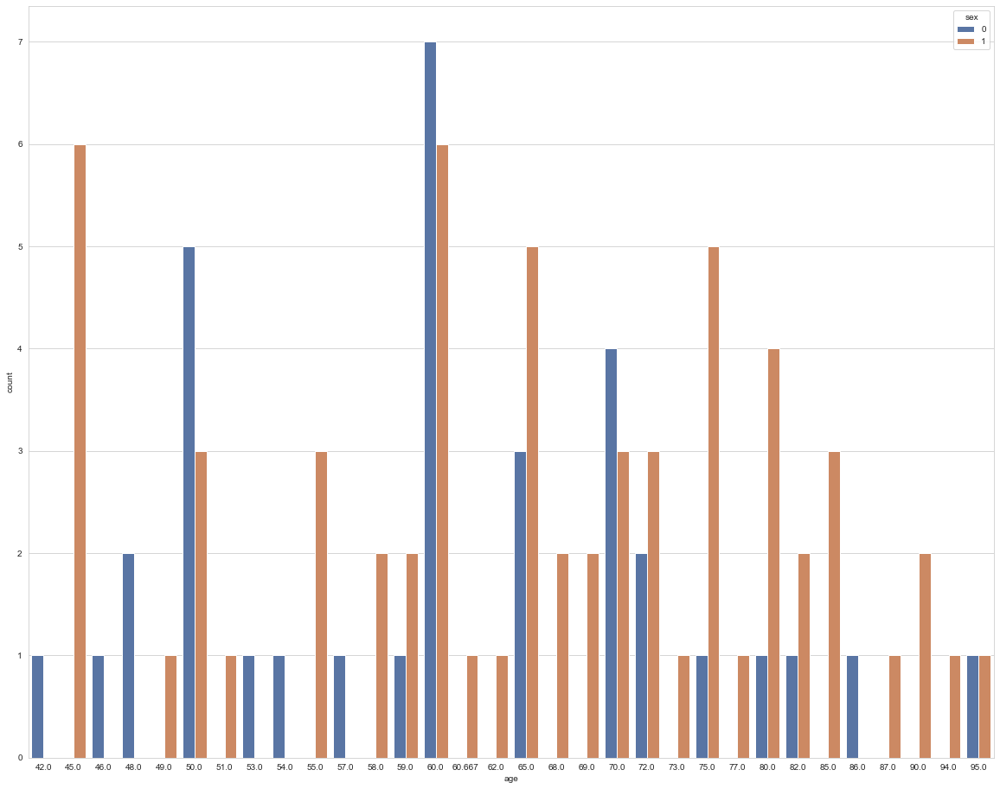

In [46]:
#Code Block 43

plt.figure(figsize = (20,16))

sns.countplot(x = "age",  data = death, hue = 'sex', palette = 'deep')


In [48]:
#Code Block 44

smoke = heart[heart['smoking'] == 1]
smoke

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
2,65.0,0,146,0,20,0,162000.0,1.3,129,1,1,7,1
5,90.0,1,47,0,40,1,204000.0,2.1,132,1,1,8,1
7,60.0,1,315,1,60,0,454000.0,1.1,131,1,1,10,1
9,80.0,1,123,0,35,1,388000.0,9.4,133,1,1,10,1
10,75.0,1,81,0,38,1,368000.0,4.0,131,1,1,10,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,52.0,0,190,1,38,0,382000.0,1.0,140,1,1,258,0
293,63.0,1,103,1,35,0,179000.0,0.9,136,1,1,270,0
294,62.0,0,61,1,38,1,155000.0,1.1,143,1,1,270,0
297,45.0,0,2413,0,38,0,140000.0,1.4,140,1,1,280,0


In [49]:
#Code Block 45

(smoke['sex'] == 0).value_counts()
#number of women who smoke

False    92
True      4
Name: sex, dtype: int64

In [50]:
#Code Block 46

smok_m = smoke[smoke['sex'] == 1]
smok_m['DEATH_EVENT'].value_counts()
#see number of men who smoked and died

0    65
1    27
Name: DEATH_EVENT, dtype: int64

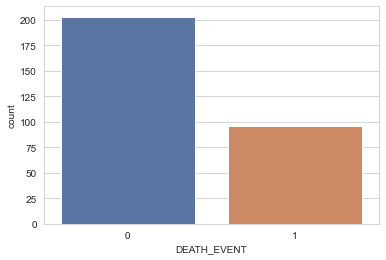

In [52]:
#Code Block 47

chart = sns.countplot(x = 'DEATH_EVENT',  data = heart, palette = 'deep')
#plot a chart to show the number of death

Text(0, 0.5, 'Count of Death')

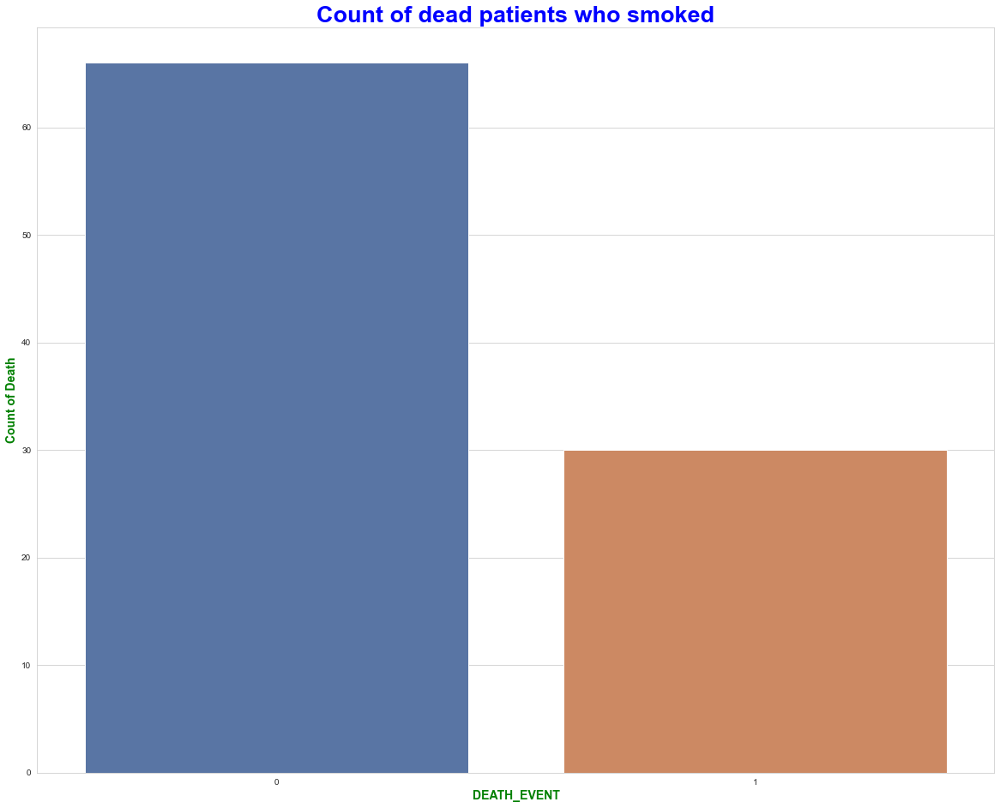

In [219]:
#Code Block 48

plt.figure(figsize = (20,16))

chart = sns.countplot(x = 'DEATH_EVENT',  data = smoke, palette = 'deep')
plt.title('Count of dead patients who smoked', fontweight='bold', color = 'blue', fontsize='27', horizontalalignment='center')
plt.xlabel('DEATH_EVENT', fontweight='bold', color = 'green', fontsize='14', horizontalalignment='center')
plt.ylabel('Count of Death', fontweight='bold', color = 'green', fontsize='14', horizontalalignment='center')
#create a countplot for smoking patients' DEATH_EVENT

<AxesSubplot:xlabel='smoking', ylabel='count'>

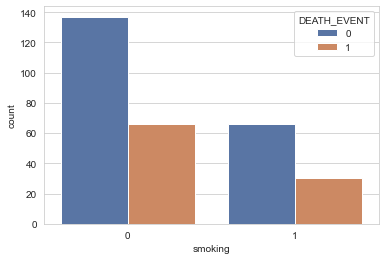

In [53]:
#Code Block 49

sns.countplot(x = 'smoking',  data = heart, hue = 'DEATH_EVENT', palette = 'deep')

Text(0, 0.5, 'Death#')

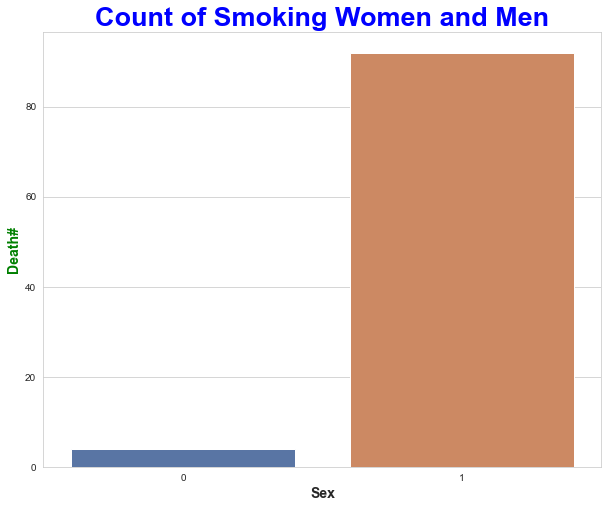

In [54]:
#Code Block 50

plt.figure(figsize = (10,8))

sns.countplot(x = 'sex', data = smoke, palette = 'deep')
plt.title('Count of Smoking Women and Men', fontweight='bold', color = 'blue', fontsize='27', horizontalalignment='center')
plt.xlabel('Sex', fontweight='bold', fontsize='14', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', color = 'green', fontsize='14', horizontalalignment='center')

Text(0, 0.5, 'DEATH_EVENT')

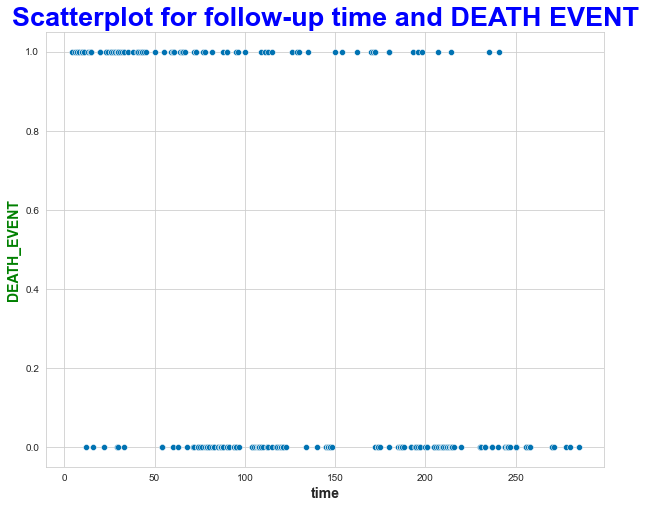

In [55]:
#Code Block 51

plt.figure(figsize = (10,8))

sns.scatterplot(x = 'time', y = 'DEATH_EVENT', data = heart, palette = 'deep')
plt.title('Scatterplot for follow-up time and DEATH EVENT', fontweight='bold', color = 'blue', fontsize='27', horizontalalignment='center')
plt.xlabel('time', fontweight='bold', fontsize='14', horizontalalignment='center')
plt.ylabel('DEATH_EVENT', fontweight='bold', color = 'green', fontsize='14', horizontalalignment='center')

Text(0, 0.5, 'Death#')

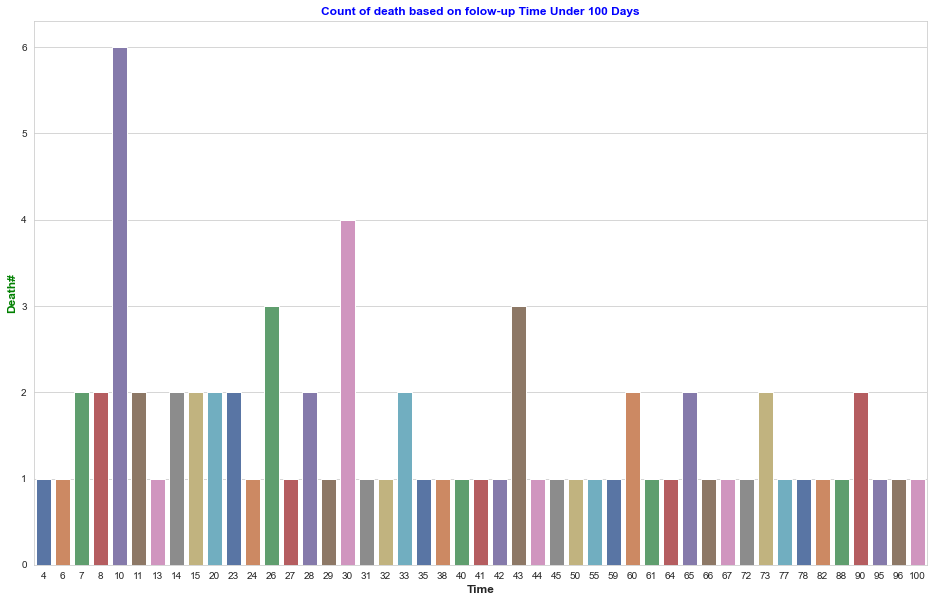

In [56]:
#Code Block 52

plt.figure(figsize = (16,10))

time100 = death[death["time"] <= 100]
sns.countplot(x = 'time', data = time100, palette = 'deep')
plt.title('Count of death based on folow-up Time Under 100 Days', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('Time', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', color = 'green', fontsize='12', horizontalalignment='center')

In [57]:
time100

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.90,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.10,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.30,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.90,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.70,116,0,0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,85.0,0,129,0,60,0,306000.00,1.20,132,1,1,90,1
113,70.0,1,143,0,60,0,351000.00,1.30,137,0,0,90,1
119,86.0,0,582,0,38,0,263358.03,1.83,134,0,0,95,1
124,60.0,0,582,0,40,0,217000.00,3.70,134,1,0,96,1


-72 patients died in less than and equals to 100 follow-up days. 
 

In [58]:
#Code Block 53

time100[time100['time'] <= 30].value_counts().sum()
#the number of patients who died before and equally of 30 follow-up days

35

In [59]:
#Code Block 54

time100[time100['time'] <= 50].value_counts().sum()

50

Text(0, 0.5, 'Death#')

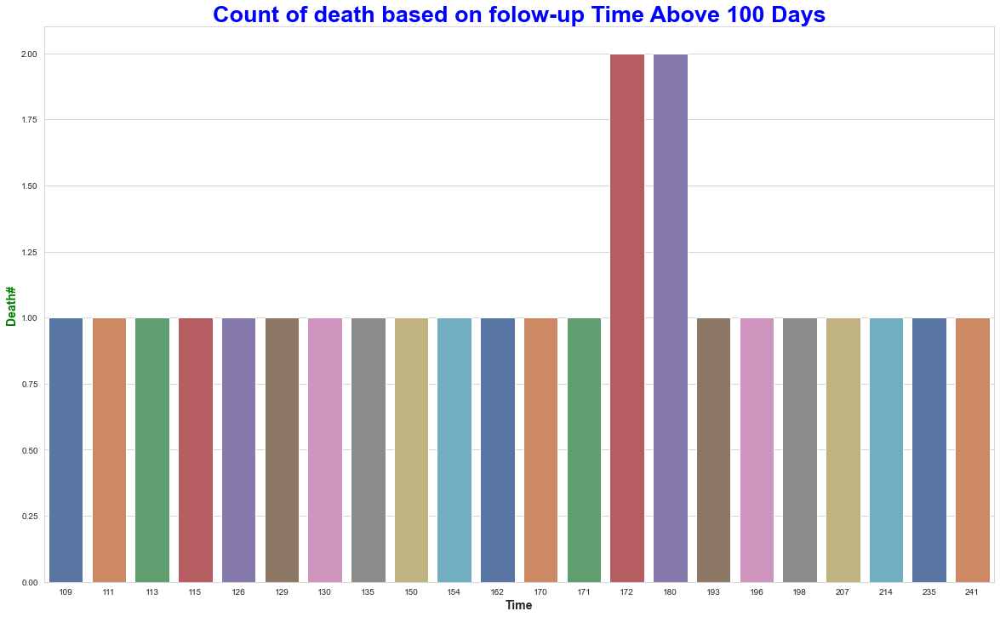

In [60]:
#Code Block 55

plt.figure(figsize = (20,12))

time250 = death[death["time"] > 100]
sns.countplot(x = 'time', data = time250, palette = 'deep')
plt.title('Count of death based on folow-up Time Above 100 Days', fontweight='bold', color = 'blue', fontsize='27', horizontalalignment='center')
plt.xlabel('Time', fontweight='bold', fontsize='14', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', color = 'green', fontsize='14', horizontalalignment='center')

### Check the abnormality level of clinical records of patients and their influenced on number of death.

In [61]:
#Code Block 56

death['ejection_fraction'].value_counts()

25    18
20    16
38    15
30    13
35     7
50     6
45     5
40     4
60     4
15     2
65     1
14     1
55     1
62     1
17     1
70     1
Name: ejection_fraction, dtype: int64

In [62]:
#Code Block 57

(death['ejection_fraction'] < 50).value_counts()

True     82
False    14
Name: ejection_fraction, dtype: int64

Text(0, 0.5, 'Death#')

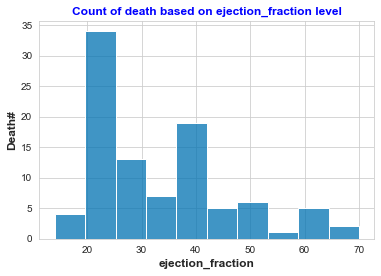

In [63]:
#Code Block 58
chart = sns.histplot(x = "ejection_fraction",  data = death, palette = 'deep')
plt.title('Count of death based on ejection_fraction level', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('ejection_fraction', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', fontsize='12', horizontalalignment='center')

Text(0, 0.5, 'Death#')

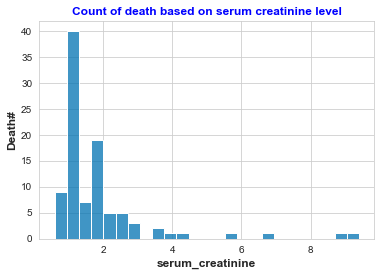

In [64]:
#Code Block 59

chart = sns.histplot(x = "serum_creatinine",  data = death, palette = 'deep')
plt.title('Count of death based on serum creatinine level', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('serum_creatinine', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', fontsize='12', horizontalalignment='center')

In [65]:
#Code Block 60

death_w = death[death['sex'] == 0]
#women who died
death_m = death[death['sex'] == 1]
#men who died 
w_crt = death_w[death_w['serum_creatinine'] > 1.1]
#create a new dataframe for death women with higher serum_creatinine level than normal
m_crt = death_w[death_w['serum_creatinine'] > 1.3]
#create a new dataframe for death men with higher serum_creatinine level than normal

Text(0, 0.5, 'Women Death#')

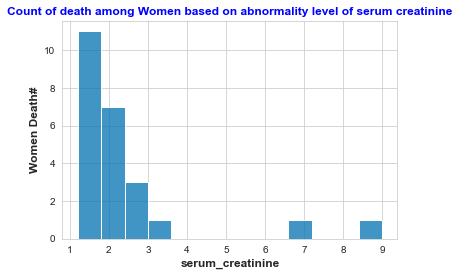

In [220]:
#Code Block 61

chart = sns.histplot(x = "serum_creatinine",  data = w_crt, palette = 'deep')
plt.title('Count of death among Women based on abnormality level of serum creatinine', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('serum_creatinine', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Women Death#' , fontweight='bold', fontsize='12', horizontalalignment='center')

In [221]:
#Code Block 62

w_crt['serum_creatinine'].value_counts().sum()
#number of death women with abnormality level of serum_creatinine 

24

Text(0, 0.5, 'Men Death#')

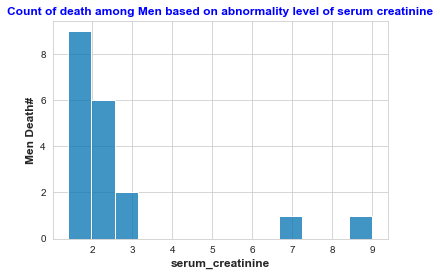

In [222]:
#Code Block 63

chart = sns.histplot(x = "serum_creatinine",  data = m_crt, palette = 'deep')
plt.title('Count of death among Men based on abnormality level of serum creatinine', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('serum_creatinine', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Men Death#' , fontweight='bold', fontsize='12', horizontalalignment='center')

In [69]:
#Code Block 64

m_crt['serum_creatinine'].value_counts().sum()

19

Text(0, 0.5, 'Death#')

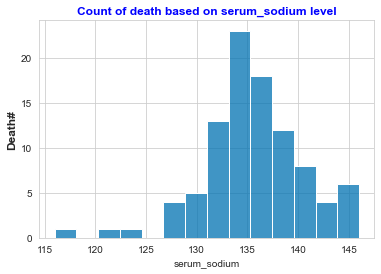

In [70]:
#Code Block 65

plt.title('Count of death based on serum_sodium level', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.chart = sns.histplot(x = "serum_sodium",  data = death, palette = 'deep')
#xlabel('serum_sodium', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', fontsize='12', horizontalalignment='center')

In [71]:
#Code Block 66

(death['serum_sodium'] < 135).value_counts()
#number of dead with lower level of serum sodium than normal 

False    54
True     42
Name: serum_sodium, dtype: int64

In [224]:
#Code Block 67

(death['serum_sodium'] > 145).value_counts()
#number of dead with higher level of serum sodium than normal 

False    95
True      1
Name: serum_sodium, dtype: int64

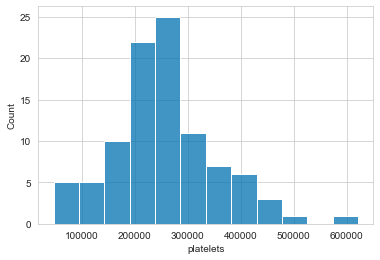

In [73]:
#Code Block 68

chart = sns.histplot(x = "platelets",  data = death, palette = 'deep')

In [223]:
#Code Block 69

(death['platelets'] < 150000).value_counts()

False    85
True     11
Name: platelets, dtype: int64

In [75]:
#Code Block 70

(death['platelets'] > 450000).value_counts()

False    91
True      5
Name: platelets, dtype: int64

Text(0, 0.5, 'Death#')

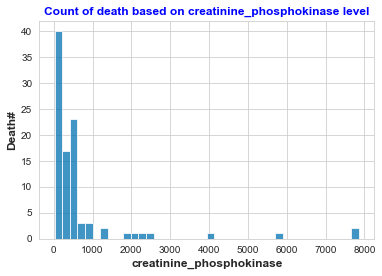

In [77]:
#Code Block 71

plt.chart = sns.histplot(x = "creatinine_phosphokinase",  data = death, palette = 'deep')
plt.title('Count of death based on creatinine_phosphokinase level', fontweight='bold', color = 'blue', fontsize='12', horizontalalignment='center')
plt.xlabel('creatinine_phosphokinase', fontweight='bold', fontsize='12', horizontalalignment='center')
plt.ylabel('Death#', fontweight='bold', fontsize='12', horizontalalignment='center')

In [78]:
#Code Block 72

(heart['creatinine_phosphokinase'] > 120).value_counts()

True     222
False     77
Name: creatinine_phosphokinase, dtype: int64

In [79]:
#Code Block 73

(death['creatinine_phosphokinase'] > 120).value_counts()

True     77
False    19
Name: creatinine_phosphokinase, dtype: int64

In [80]:
#Code Block 74

(death_w['creatinine_phosphokinase'] > 120).value_counts()

True     30
False     4
Name: creatinine_phosphokinase, dtype: int64

In [81]:
#Code Block 75

(death_m['creatinine_phosphokinase'] > 120).value_counts()

True     47
False    15
Name: creatinine_phosphokinase, dtype: int64

In [82]:
#Code Block 76

cpk120 = death[death['creatinine_phosphokinase'] > 120]
cpk120['DEATH_EVENT']

0      1
1      1
2      1
4      1
6      1
      ..
220    1
230    1
246    1
262    1
266    1
Name: DEATH_EVENT, Length: 77, dtype: int64

In [83]:
#Code Block 77

anaem_d = death[death['anaemia'] == 1]
anaem_d_diabt = anaem_d[anaem_d['diabetes'] == 1]
anaem_d_diabt_high = anaem_d_diabt[anaem_d_diabt['high_blood_pressure'] == 1]
(anaem_d_diabt['high_blood_pressure'] == 1).value_counts()

False    12
True      6
Name: high_blood_pressure, dtype: int64

In [84]:
#Code Block 78

anaem_d_diabt_high

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
21,65.0,1,128,1,30,1,297000.0,1.6,136,0,0,20,1
32,50.0,1,249,1,35,1,319000.0,1.0,128,0,0,28,1
37,82.0,1,855,1,50,1,321000.0,1.0,145,0,0,30,1
53,70.0,1,69,1,50,1,351000.0,1.0,134,0,0,44,1
84,59.0,1,280,1,25,1,302000.0,1.0,141,0,0,78,1
213,48.0,1,131,1,30,1,244000.0,1.6,130,0,0,193,1


- There are 6 patients with anaemia, diabets, high blodd pressure who died and they are all non-smoking men. 

In [86]:
#Code Block 79

(women['diabetes']==1).value_counts()

True     55
False    50
Name: diabetes, dtype: int64

In [87]:
#Code Block 80

(men['diabetes']==1).value_counts()

False    124
True      70
Name: diabetes, dtype: int64

In [88]:
#Code Block 81

(death_w['diabetes']==1).value_counts()

True     20
False    14
Name: diabetes, dtype: int64

In [89]:
#Code Block 82

(death_m['diabetes']==1).value_counts()

False    42
True     20
Name: diabetes, dtype: int64

In [90]:
#Code Block 83

death = heart[heart['DEATH_EVENT'] == 1]
death.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96 entries, 0 to 266
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       96 non-null     float64
 1   anaemia                   96 non-null     int64  
 2   creatinine_phosphokinase  96 non-null     int64  
 3   diabetes                  96 non-null     int64  
 4   ejection_fraction         96 non-null     int64  
 5   high_blood_pressure       96 non-null     int64  
 6   platelets                 96 non-null     float64
 7   serum_creatinine          96 non-null     float64
 8   serum_sodium              96 non-null     int64  
 9   sex                       96 non-null     int64  
 10  smoking                   96 non-null     int64  
 11  time                      96 non-null     int64  
 12  DEATH_EVENT               96 non-null     int64  
dtypes: float64(3), int64(10)
memory usage: 10.5 KB


### Compare statistics properties of some of the features among women and men based on who survived and died 

In [91]:
#Code Block 84

death.describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.00000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.0
mean,65.215281,0.479167,670.197917,0.416667,33.468750,0.40625,256381.044792,1.835833,135.375000,0.645833,0.312500,70.885417,1.0
std,13.214556,0.502188,1316.580640,0.495595,12.525303,0.49371,98525.682856,1.468562,5.001579,0.480771,0.465946,62.378281,0.0
min,42.000000,0.000000,23.000000,0.000000,14.000000,0.00000,47000.000000,0.600000,116.000000,0.000000,0.000000,4.000000,1.0
25%,55.000000,0.000000,128.750000,0.000000,25.000000,0.00000,197500.000000,1.075000,133.000000,0.000000,0.000000,25.500000,1.0
50%,65.000000,0.000000,259.000000,0.000000,30.000000,0.00000,258500.000000,1.300000,135.500000,1.000000,0.000000,44.500000,1.0
75%,75.000000,1.000000,582.000000,1.000000,38.000000,1.00000,311000.000000,1.900000,138.250000,1.000000,1.000000,102.250000,1.0
max,95.000000,1.000000,7861.000000,1.000000,70.000000,1.00000,621000.000000,9.400000,146.000000,1.000000,1.000000,241.000000,1.0


In [92]:
#Code Block 85

heart[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'ejection_fraction',
       'high_blood_pressure', 'platelets','serum_creatinine', 'sex', 'smoking','time',
       'serum_sodium', 'DEATH_EVENT']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,sex,smoking,time,serum_sodium,DEATH_EVENT
count,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.000000,299.00000,299.000000,299.00000,299.000000,299.000000,299.00000
mean,60.833893,0.431438,581.839465,0.418060,38.083612,0.351171,263358.029264,1.39388,0.648829,0.32107,130.260870,136.625418,0.32107
std,11.894809,0.496107,970.287881,0.494067,11.834841,0.478136,97804.236869,1.03451,0.478136,0.46767,77.614208,4.412477,0.46767
min,40.000000,0.000000,23.000000,0.000000,14.000000,0.000000,25100.000000,0.50000,0.000000,0.00000,4.000000,113.000000,0.00000
25%,51.000000,0.000000,116.500000,0.000000,30.000000,0.000000,212500.000000,0.90000,0.000000,0.00000,73.000000,134.000000,0.00000
50%,60.000000,0.000000,250.000000,0.000000,38.000000,0.000000,262000.000000,1.10000,1.000000,0.00000,115.000000,137.000000,0.00000
75%,70.000000,1.000000,582.000000,1.000000,45.000000,1.000000,303500.000000,1.40000,1.000000,1.00000,203.000000,140.000000,1.00000
max,95.000000,1.000000,7861.000000,1.000000,80.000000,1.000000,850000.000000,9.40000,1.000000,1.00000,285.000000,148.000000,1.00000


In [93]:
#Code Block 86

survived = heart[heart['DEATH_EVENT'] == 0]
survived[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'ejection_fraction',
       'high_blood_pressure', 'platelets','serum_creatinine', 'serum_sodium', 'sex', 
       'smoking','time','DEATH_EVENT']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.0
mean,58.761906,0.408867,540.054187,0.418719,40.266010,0.325123,266657.489901,1.184877,137.216749,0.650246,0.325123,158.339901,0.0
std,10.637890,0.492840,753.799572,0.494569,10.859963,0.469579,97531.202283,0.654083,3.982923,0.478071,0.469579,67.742872,0.0
min,40.000000,0.000000,30.000000,0.000000,17.000000,0.000000,25100.000000,0.500000,113.000000,0.000000,0.000000,12.000000,0.0
25%,50.000000,0.000000,109.000000,0.000000,35.000000,0.000000,219500.000000,0.900000,135.500000,0.000000,0.000000,95.000000,0.0
50%,60.000000,0.000000,245.000000,0.000000,38.000000,0.000000,263000.000000,1.000000,137.000000,1.000000,0.000000,172.000000,0.0
75%,65.000000,1.000000,582.000000,1.000000,45.000000,1.000000,302000.000000,1.200000,140.000000,1.000000,1.000000,213.000000,0.0
max,90.000000,1.000000,5209.000000,1.000000,80.000000,1.000000,850000.000000,6.100000,148.000000,1.000000,1.000000,285.000000,0.0


In [94]:
#Code Block 87

death[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'ejection_fraction',
       'high_blood_pressure', 'platelets','serum_creatinine', 'serum_sodium', 'sex', 
       'smoking','time','DEATH_EVENT']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.00000,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000,96.0
mean,65.215281,0.479167,670.197917,0.416667,33.468750,0.40625,256381.044792,1.835833,135.375000,0.645833,0.312500,70.885417,1.0
std,13.214556,0.502188,1316.580640,0.495595,12.525303,0.49371,98525.682856,1.468562,5.001579,0.480771,0.465946,62.378281,0.0
min,42.000000,0.000000,23.000000,0.000000,14.000000,0.00000,47000.000000,0.600000,116.000000,0.000000,0.000000,4.000000,1.0
25%,55.000000,0.000000,128.750000,0.000000,25.000000,0.00000,197500.000000,1.075000,133.000000,0.000000,0.000000,25.500000,1.0
50%,65.000000,0.000000,259.000000,0.000000,30.000000,0.00000,258500.000000,1.300000,135.500000,1.000000,0.000000,44.500000,1.0
75%,75.000000,1.000000,582.000000,1.000000,38.000000,1.00000,311000.000000,1.900000,138.250000,1.000000,1.000000,102.250000,1.0
max,95.000000,1.000000,7861.000000,1.000000,70.000000,1.00000,621000.000000,9.400000,146.000000,1.000000,1.000000,241.000000,1.0


In [95]:
#Code Block 88

death_w[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'ejection_fraction',
       'high_blood_pressure', 'platelets','serum_creatinine', 'serum_sodium',
       'smoking','time']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,smoking,time
count,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000,34.000000
mean,62.176471,0.588235,507.676471,0.588235,37.529412,0.500000,259512.709412,1.945882,135.470588,0.088235,73.970588
std,12.327527,0.499554,779.714506,0.499554,14.560709,0.507519,107588.586768,1.642137,6.707008,0.287902,58.503813
min,42.000000,0.000000,69.000000,0.000000,15.000000,0.000000,62000.000000,0.600000,116.000000,0.000000,8.000000
25%,50.750000,0.000000,134.000000,0.000000,26.250000,0.000000,196000.000000,1.025000,132.500000,0.000000,30.000000
50%,60.000000,1.000000,242.000000,1.000000,35.000000,0.500000,259179.015000,1.550000,136.000000,0.000000,52.500000
75%,70.000000,1.000000,582.000000,1.000000,48.750000,1.000000,320500.000000,2.100000,140.000000,0.000000,98.750000
max,95.000000,1.000000,3964.000000,1.000000,70.000000,1.000000,621000.000000,9.000000,146.000000,1.000000,207.000000


In [96]:
#Code Block 78

death_m[['age', 'anaemia', 'creatinine_phosphokinase','diabetes', 'ejection_fraction',
       'high_blood_pressure', 'platelets','serum_creatinine', 'serum_sodium',
       'smoking','time']].describe()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,smoking,time
count,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000,62.000000
mean,66.881726,0.419355,759.322581,0.322581,31.241935,0.354839,254663.680323,1.775484,135.322581,0.435484,69.193548
std,13.482374,0.497482,1532.267695,0.471280,10.742417,0.482370,94060.769258,1.374583,3.823029,0.499868,64.807366
min,45.000000,0.000000,23.000000,0.000000,14.000000,0.000000,47000.000000,0.600000,127.000000,0.000000,4.000000
25%,58.250000,0.000000,122.250000,0.000000,21.250000,0.000000,201000.000000,1.100000,133.250000,0.000000,20.750000
50%,66.500000,0.000000,367.500000,0.000000,30.000000,0.000000,258000.000000,1.300000,135.000000,0.000000,42.000000
75%,75.000000,1.000000,582.000000,1.000000,38.000000,1.000000,301750.000000,1.882500,137.750000,1.000000,105.750000
max,95.000000,1.000000,7861.000000,1.000000,60.000000,1.000000,497000.000000,9.400000,145.000000,1.000000,241.000000


## Logistic Regression Model

### Import all libraries we need for logistic regression, decision tree and random forest classifications

In [97]:
#Code Block 79

heart.info('type')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   age                       299 non-null    float64
 1   anaemia                   299 non-null    int64  
 2   creatinine_phosphokinase  299 non-null    int64  
 3   diabetes                  299 non-null    int64  
 4   ejection_fraction         299 non-null    int64  
 5   high_blood_pressure       299 non-null    int64  
 6   platelets                 299 non-null    float64
 7   serum_creatinine          299 non-null    float64
 8   serum_sodium              299 non-null    int64  
 9   sex                       299 non-null    int64  
 10  smoking                   299 non-null    int64  
 11  time                      299 non-null    int64  
 12  DEATH_EVENT               299 non-null    int64  
dtypes: float64(3), int64(10)
memory usage: 30.5 KB


In [98]:
#Code Block 80

from sklearn.tree import DecisionTreeClassifier # to build a classification tree
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from sklearn.model_selection import train_test_split # to split data into training and testing sets
from sklearn.model_selection import cross_val_score # for cross validation
from sklearn.metrics import confusion_matrix, classification_report # to create a confusion matrix and classification report
from sklearn.metrics import plot_confusion_matrix # to draw a confusion matrix
from sklearn import tree
from sklearn.tree import plot_tree # to draw a classification tree
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, roc_auc_score

In [100]:
#Code Block 81

heart['age'] = heart['age'].astype(int)
heart['platelets'] = heart['platelets'].astype(int)
heart['serum_creatinine'] = heart['serum_creatinine'].astype(int)
heart.info('type')
#Resetting the data types to all integers

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 299 entries, 0 to 298
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   age                       299 non-null    int64
 1   anaemia                   299 non-null    int64
 2   creatinine_phosphokinase  299 non-null    int64
 3   diabetes                  299 non-null    int64
 4   ejection_fraction         299 non-null    int64
 5   high_blood_pressure       299 non-null    int64
 6   platelets                 299 non-null    int64
 7   serum_creatinine          299 non-null    int64
 8   serum_sodium              299 non-null    int64
 9   sex                       299 non-null    int64
 10  smoking                   299 non-null    int64
 11  time                      299 non-null    int64
 12  DEATH_EVENT               299 non-null    int64
dtypes: int64(13)
memory usage: 30.5 KB


In [101]:
#Code Block 82

X = heart.drop(['DEATH_EVENT'], axis = 1)
y = heart['DEATH_EVENT']
#create X and y dataset
y.value_counts()

0    203
1     96
Name: DEATH_EVENT, dtype: int64

In [102]:
#Code Block 83

from sklearn.model_selection import train_test_split
#import train_test_split  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)
#split X and y datasets

### Create the standard scaled versions of X_training and X_test datasets


In [103]:
#Code Block 84

from sklearn.preprocessing import StandardScaler

#standardize the data
sc = preprocessing.StandardScaler()
sc.fit(X_train)
X_train_sc = sc.transform(X_train)
X_train_sc = pd.DataFrame(X_train_sc, columns=X_train.columns)
X_test_sc = sc.transform(X_test)
X_test_sc = pd.DataFrame(X_test_sc, columns=X_test.columns)

In [104]:
#Code Block 85

model = LogisticRegression()
model.fit(X_train, y_train)
#fit the model 
model_pred = model.predict(X_test)
#predict 
score = model.score(X_test, y_test)
print("LogisticRegression accuracy score is:",score)
report = classification_report(y_test, model_pred)
print(report)

LogisticRegression accuracy score is: 0.7888888888888889
              precision    recall  f1-score   support

           0       0.84      0.88      0.85        64
           1       0.65      0.58      0.61        26

    accuracy                           0.79        90
   macro avg       0.74      0.73      0.73        90
weighted avg       0.78      0.79      0.78        90



In [105]:
#Code Block 86

score = model.score(X_test, y_test)
#score our model's accuracy
print(score)

0.7888888888888889


In [106]:
#Code Block 87

print(confusion_matrix(y_test, model_pred))

[[56  8]
 [11 15]]


In [107]:
#Code Block 88

display(y_test.value_counts())
round(y_test.value_counts(normalize=True),5)

0    64
1    26
Name: DEATH_EVENT, dtype: int64

0    0.71111
1    0.28889
Name: DEATH_EVENT, dtype: float64

In [108]:
#Code Block 89

df_cm = pd.DataFrame(confusion_matrix(y_test, model_pred), columns = ['Pred_0', 'Pred_1'], index = ['Actual_0', 'Actual_1'])
#make a dataframe for confusion matrix
df_cm

,Pred_0,Pred_1
Actual_0,56,8
Actual_1,11,15


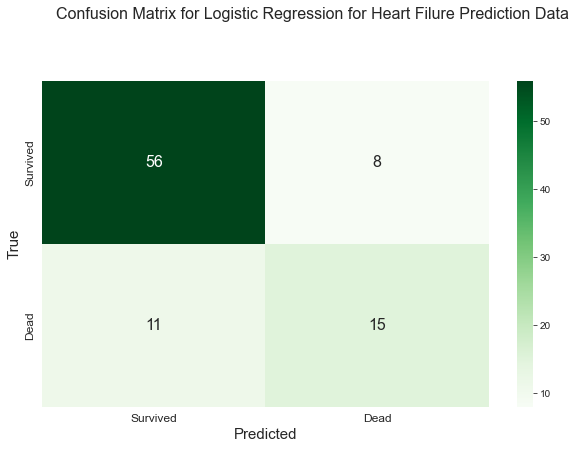

In [109]:
#Code Block 91

fig, axes = plt.subplots(nrows=1, ncols=1, sharex=True, figsize=(10, 6))
fig.suptitle('Confusion Matrix for Logistic Regression for Heart Filure Prediction Data', 
             fontsize=16, y=1.05)
ax = plt.subplot()
sns.heatmap(df_cm, annot=True, cmap="Greens", annot_kws={"size": 16}, ax=ax, fmt="g")
ax.set_xlabel('Predicted', fontsize=15)
ax.set_ylabel('True', fontsize=15)
ax.xaxis.set_ticklabels(['Survived', 'Dead'], fontsize=12)
ax.yaxis.set_ticklabels(['Survived', 'Dead'], fontsize=12, va='center')
plt.show()
#create a heatmap for confusion matrix 

### Classification Report

In [110]:
#Code Block 92

print('Accuracy Score:')
print(score)
print('')
print('-----------------------------------------------------------')
#Display the confusion matrix
print('Confusion Matrix:')
print(confusion_matrix(y_test, model_pred))
print('')
#Print the Classification Report
print('-----------------------------------------------------------')
print('Classification Report:')
print(classification_report(y_test, model_pred, target_names=['Survived', 'Dead'], digits=4))

Accuracy Score:
0.7888888888888889

-----------------------------------------------------------
Confusion Matrix:
[[56  8]
 [11 15]]

-----------------------------------------------------------
Classification Report:
              precision    recall  f1-score   support

    Survived     0.8358    0.8750    0.8550        64
        Dead     0.6522    0.5769    0.6122        26

    accuracy                         0.7889        90
   macro avg     0.7440    0.7260    0.7336        90
weighted avg     0.7828    0.7889    0.7848        90



### View Precision and Recall Scores

In [111]:
#Code Block 93

recall = recall_score(y_test, model_pred)
recall_format = 'Recall Score: {0:.4f}'.format(recall)
print(recall_format)
print('')
precision = precision_score(y_test, model_pred)
precision_format = 'Precision Score: {0:.4f}'.format(precision)
print(precision_format)

Recall Score: 0.5769

Precision Score: 0.6522


### ROC AUC Score

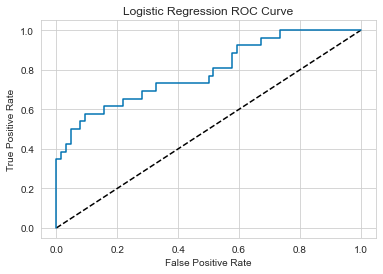

In [112]:
#Code Block 94

y_pred_prob = model.predict_proba(X_test)[:,1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(fpr, tpr, label='Logistic Regression')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression ROC Curve')
plt.show();

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test,model_pred)

In [113]:
#Code Block 95

roc_auc_score(y_test, y_pred_prob)

0.7896634615384616

### Create a Short Version of a Defined Function for Building a Model


In [114]:
#Code Block 96

def shorttraintest(vartrain, vartest, y_train, y_test, model):

    #Fit the model
    model.fit(vartrain, y_train)

    #Predict with the model
    model_pred = model.predict(vartest)
    model_prob = model.predict_proba(vartest)


    print('Confusion Matrix:')
    print(confusion_matrix(y_test, model_pred))
    print("")

    #Assess with the model
    score = model.score(vartest, y_test)
    score_format = 'Accuracy Score: {0:.4f}'.format(score)
    print(score_format)

    recall = recall_score(y_test, model_pred)
    recall_format = 'Recall Score: {0:.4f}'.format(recall)
    print(recall_format)
    
    precision = precision_score(y_test, model_pred)
    precision_format = 'Precision Score: {0:.4f}'.format(precision)
    print(precision_format)
    
    # calculate roc curve
    y_pred_prob = model.predict_proba(vartest)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
    print(roc_auc_format)
    print('')

In [115]:
#Code Block 97

#Set the X training and test datasets
vartrain = X_train_sc
vartest = X_test_sc
model = LogisticRegression(random_state=1)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[58  6]
 [ 9 17]]

Accuracy Score: 0.8333
Recall Score: 0.6538
Precision Score: 0.7391
ROC AUC Score: 0.8648



### Use a For Loop to set C


In [116]:
#Code Block 98

# finding the optimal model based on c

C_penalty = [0.0001, 0.001, 0.01, 0.1, 0.5, 1, 5, 10, 100, 150, 500]
vartrain = X_train_sc
vartest = X_test_sc
for c in C_penalty:
    print('----------------------')
    vartitle = "Model with C: " + str(c)
    varC_penalty = c
    model = LogisticRegression(random_state = 1, C=varC_penalty)
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)
    print('----------------------')

----------------------
Model with C: 0.0001

Confusion Matrix:
[[64  0]
 [26  0]]

Accuracy Score: 0.7111
Recall Score: 0.0000
Precision Score: 0.0000
ROC AUC Score: 0.8810

----------------------
----------------------
Model with C: 0.001

Confusion Matrix:
[[64  0]
 [26  0]]

Accuracy Score: 0.7111
Recall Score: 0.0000
Precision Score: 0.0000
ROC AUC Score: 0.8816

----------------------
----------------------
Model with C: 0.01

Confusion Matrix:
[[62  2]
 [22  4]]

Accuracy Score: 0.7333
Recall Score: 0.1538
Precision Score: 0.6667
ROC AUC Score: 0.8810

----------------------
----------------------
Model with C: 0.1

Confusion Matrix:
[[61  3]
 [10 16]]

Accuracy Score: 0.8556
Recall Score: 0.6154
Precision Score: 0.8421
ROC AUC Score: 0.8696

----------------------
----------------------
Model with C: 0.5

Confusion Matrix:
[[58  6]
 [ 9 17]]

Accuracy Score: 0.8333
Recall Score: 0.6538
Precision Score: 0.7391
ROC AUC Score: 0.8660

----------------------
----------------------
M

In [117]:
#Code Block 99

# optmial model
# we decided to set the optimal model with C = 10
vartrain = X_train_sc
vartest = X_test_sc
model = LogisticRegression(random_state = 1, C = 0.1)

shorttraintest(vartrain, vartest, y_train, y_test, model)


Confusion Matrix:
[[61  3]
 [10 16]]

Accuracy Score: 0.8556
Recall Score: 0.6154
Precision Score: 0.8421
ROC AUC Score: 0.8696



In [118]:
#Code Block 100

#decision model
# seeing how the different settings for class weight effect the recall and precision score with c = 10
cw = [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4}, 
      {0:1, 1:4.5},{0:1, 1:5}, {0:1, 1:5.5},{0:1, 1:10}, {0:1, 1:100}]

vartrain = X_train_sc
vartest = X_test_sc

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w)
    varcw = w
    model = LogisticRegression(random_state = 1, C = 0.1, class_weight=varcw)
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)
    print('----------------------')

----------------------
Model with Class Weight: None

Confusion Matrix:
[[61  3]
 [10 16]]

Accuracy Score: 0.8556
Recall Score: 0.6154
Precision Score: 0.8421
ROC AUC Score: 0.8696

----------------------
----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[50 14]
 [ 8 18]]

Accuracy Score: 0.7556
Recall Score: 0.6923
Precision Score: 0.5625
ROC AUC Score: 0.8708

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 1.5}

Confusion Matrix:
[[56  8]
 [ 8 18]]

Accuracy Score: 0.8222
Recall Score: 0.6923
Precision Score: 0.6923
ROC AUC Score: 0.8708

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[50 14]
 [ 8 18]]

Accuracy Score: 0.7556
Recall Score: 0.6923
Precision Score: 0.5625
ROC AUC Score: 0.8708

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[48 16]
 [ 4 22]]

Accuracy Score: 0.7778
Recall Score: 0.8462
Precisio

### Using Logistic Regression create a model using scaled data


In [119]:
#Code Block 101

# we decided to set the optimal model with class weight = None which give us the highest accuracy score
vartrain = X_train_sc
vartest = X_test_sc
model = LogisticRegression(random_state = 1, C = 0.1, class_weight= None)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[61  3]
 [10 16]]

Accuracy Score: 0.8556
Recall Score: 0.6154
Precision Score: 0.8421
ROC AUC Score: 0.8696



### Randomized Search

In [120]:
#Code Block 102

from sklearn.model_selection import RandomizedSearchCV

grid={"C":[0.1, 0.5, 1, 5, 10], "penalty":["l1","l2"], 
     "class_weight": [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2.5}, {0:1, 1:3}], "solver":['lbfgs', 'liblinear']}
logreg = LogisticRegression(random_state=1)
logreg_cv = RandomizedSearchCV(logreg,grid,cv=5)
logreg_cv.fit(vartrain,y_train)

print("tuned hyperparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)

tuned hyperparameters :(best parameters)  {'solver': 'lbfgs', 'penalty': 'l2', 'class_weight': {0: 1, 1: 1.5}, 'C': 1}
accuracy : 0.7845528455284553


### Grid Search

In [121]:
#Code Block 103

from sklearn.model_selection import GridSearchCV

grid={"C":[0.1, 0.5, 1, 5, 10], "penalty":["l1","l2","elasticnet"], 
    "class_weight": [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2.5}, {0:1, 1:3}], "solver":['lbfgs', 'liblinear','saga']}
logreg = LogisticRegression(random_state = 1)
logreg_cv = GridSearchCV(logreg,grid,cv = 5)
logreg_cv.fit(vartrain,y_train)

print("Tuned hyperparameters :(best parameters) ",logreg_cv.best_params_)
print("Accuracy :",logreg_cv.best_score_)

Tuned hyperparameters :(best parameters)  {'C': 0.1, 'class_weight': None, 'penalty': 'l1', 'solver': 'saga'}
Accuracy : 0.8422764227642275


In [122]:
#Code Block 104

vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = LogisticRegression(random_state = 1, C = 0.1, class_weight = None, penalty = 'l1', solver = 'saga')

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model

Confusion Matrix:
[[59  5]
 [10 16]]

Accuracy Score: 0.8333
Recall Score: 0.6154
Precision Score: 0.7619
ROC AUC Score: 0.8618



In [123]:
#Code Block 105

vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = LogisticRegression(random_state = 1, C = 1, class_weight = None,penalty = 'l1', solver = 'saga')

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model

Confusion Matrix:
[[59  5]
 [ 9 17]]

Accuracy Score: 0.8444
Recall Score: 0.6538
Precision Score: 0.7727
ROC AUC Score: 0.8660



In [124]:
#Code Block 106

#decision model
# seeing how the different settings for class weight effect the recall and precision score with c = 10
cw = [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4}, 
      {0:1, 1:4.5},{0:1, 1:5}, {0:1, 1:5.5},{0:1, 1:10}, {0:1, 1:100}]

vartrain = X_train_sc
vartest = X_test_sc

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w)
    varcw = w
    model = LogisticRegression(random_state = 1, C = 1, class_weight=varcw,
                              penalty = 'l1', solver = 'saga')
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)
    print('----------------------')

----------------------
Model with Class Weight: None

Confusion Matrix:
[[59  5]
 [ 9 17]]

Accuracy Score: 0.8444
Recall Score: 0.6538
Precision Score: 0.7727
ROC AUC Score: 0.8660

----------------------
----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[51 13]
 [ 8 18]]

Accuracy Score: 0.7667
Recall Score: 0.6923
Precision Score: 0.5806
ROC AUC Score: 0.8648

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 1.5}

Confusion Matrix:
[[53 11]
 [ 8 18]]

Accuracy Score: 0.7889
Recall Score: 0.6923
Precision Score: 0.6207
ROC AUC Score: 0.8672

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[51 13]
 [ 8 18]]

Accuracy Score: 0.7667
Recall Score: 0.6923
Precision Score: 0.5806
ROC AUC Score: 0.8648

----------------------
----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[47 17]
 [ 6 20]]

Accuracy Score: 0.7444
Recall Score: 0.7692
Precisio

In [125]:
#Code Block 107

vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = LogisticRegression(random_state = 1, C = 5, class_weight ={0:1, 1:1.5}, penalty = 'l1', solver = 'saga')

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model

Confusion Matrix:
[[53 11]
 [ 8 18]]

Accuracy Score: 0.7889
Recall Score: 0.6923
Precision Score: 0.6207
ROC AUC Score: 0.8654



In [126]:
#Code Block 108

vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = LogisticRegression(random_state = 1, C = 0.1, class_weight ={0:1, 1:1.5}, penalty = 'l1', solver = 'saga')

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model

Confusion Matrix:
[[55  9]
 [ 8 18]]

Accuracy Score: 0.8111
Recall Score: 0.6923
Precision Score: 0.6667
ROC AUC Score: 0.8636



In [127]:
#Code Block 109

vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = LogisticRegression(random_state = 1, C = 0.1, class_weight =None, penalty = 'l1', solver = 'liblinear')

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model

Confusion Matrix:
[[57  7]
 [ 8 18]]

Accuracy Score: 0.8333
Recall Score: 0.6923
Precision Score: 0.7200
ROC AUC Score: 0.8636



In [128]:
#Code Block 110

model_pred = model.predict(vartest)
cm_dt_dec = pd.DataFrame(confusion_matrix(y_test, model_pred))
#crete a confusion matrix dataframe for decision model
cm_dt_dec


,0,1
0,57,7
1,8,18


In [129]:
#Code Block 111

vartrain = X_train_sc
vartest = X_test_sc

model = LogisticRegression(random_state = 1, C = 0.1, class_weight= None)
model.fit(vartrain, y_train)

model_pred = model.predict(vartest)

cm_dt_opt = pd.DataFrame(confusion_matrix(y_test, model_pred))
#crete a confusion matrix dataframe for optimal model

[Text(0, 0.5, 'Survived'), Text(0, 1.5, 'Dead')]

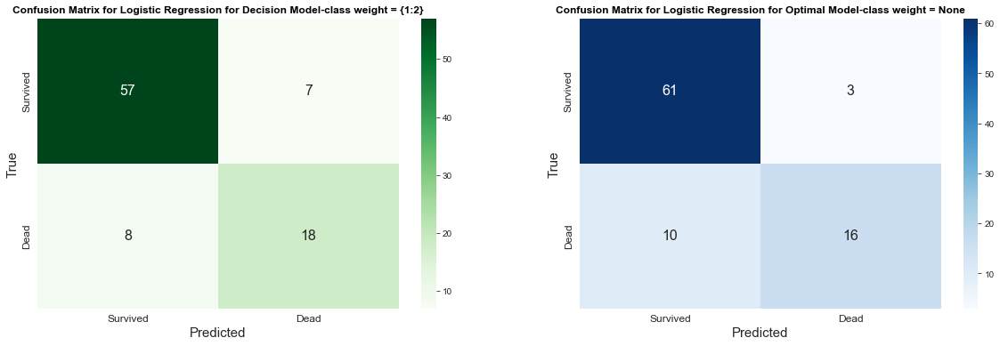

In [130]:
#Code Block 112

plt.figure(figsize=(20,6))

plt.subplot(121)
plt.title('Confusion Matrix for Logistic Regression for Decision Model-class weight = {1:2}', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_dec, annot=True, cmap="Greens", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')

plt.subplot(122)
plt.title('Confusion Matrix for Logistic Regression for Optimal Model-class weight = None', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_opt, annot=True, cmap="Blues", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')


In [1]:
plt.figure(figsize=(20,6))
plt.title('Confusion Matrix for Logistic Regression for Decision Model-class weight = {1:2}', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_dec, annot=True, cmap="Greens", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')


NameError: name 'plt' is not defined

In [132]:
#Code Block 113

importances = pd.DataFrame(data={
    'Attribute': X_train.columns,
    'Importance': model.coef_[0]
})
#create a dataframe for feature importances 
importances = importances.sort_values(by='Importance', ascending=False)

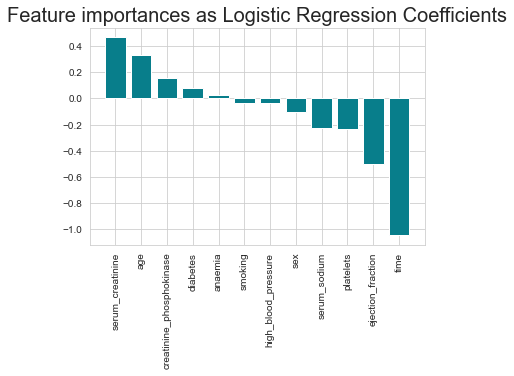

In [133]:
#Code Block 114

plt.bar(x=importances['Attribute'], height=importances['Importance'], color='#087E8B')
plt.title('Feature importances as Logistic Regression Coefficients', size=12)
plt.xticks(rotation='vertical')
plt.show()


- Explanation: the larger the coefficient is (in both positive and negative direction), the more influence it has on a prediction.

### Explanation for Final Logistic Regression Model:
- Among all paramters, I chose the last one with C=0.1, class_weight =None, penalty = 'l1', solver = 'liblinear', as it gives us better accuracy and recall scores. 
- From the confusion matrix, with this model we predict 18 times correctly for dead and just 8 times wrong out of all 26 deaths while the model predicts 57 times right and 7 times wrong among 64 survived. 
- Logistic regression model ended up with accuracy score of 0.833 and recall score of 0.6923. 

## Building Classification Models

### Rndom Forests Model

In [134]:
#Code Block 115

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import cross_val_score
#Import functions fopr Decision Tree 

### Create a Defined Function for building a model

In [135]:
#Code Block 116

def modeltraintest(vartrain, vartest, y_train, y_test, model):

    #1) Set the properties for the model (model) - by setting vartrain, vartest, and model
    
    #2) Fit the model with training data
    model.fit(vartrain, y_train)

    #3) Predict the target variable with test data
    model_pred = model.predict(vartest)
    model_prob = model.predict_proba(vartest)

    #4) Assess the accuracy with the test data
    score = model.score(vartest, y_test)

    print('XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX')
    print(round(score, 6))
    print("")


    print('XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX')
    print(confusion_matrix(y_test, model_pred))
    print("")


    print('XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX')
    print(classification_report(y_test, model_pred))
    print('')


    print('XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX')
    print('')
    y_pred_prob = model.predict_proba(vartest)[:,1]

    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    plt.plot([0, 1], [0, 1],'k--')
    plt.plot(fpr, tpr, label='Classification Model')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.show();

    # calculate roc curve
    y_pred_prob = model.predict_proba(vartest)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
    print(roc_auc_format)
    print('')


    print('XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX')
    print('')
    cv_scores = cross_val_score(model, vartrain, y_train, cv=5,
    scoring='accuracy')
    print('CV Accuracy Scores:')
    print(cv_scores)
    print('')
    cv_rocauc = cross_val_score(model, vartrain, y_train, cv=5,
    scoring='roc_auc')
    print('CV ROC AUC:')
    print(cv_rocauc)

    print('')
    print('XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX')

### Create a short version of the modeling results

In [136]:
#Code Block 117

def shorttraintest(vartrain, vartest, y_train, y_test, model):

    #Fit the model
    model.fit(vartrain, y_train)

    #Predict with the model
    model_pred = model.predict(vartest)
    model_prob = model.predict_proba(vartest)


    print('Confusion Matrix:')
    print(confusion_matrix(y_test, model_pred))
    print("")

    #Assess with the model
    score = model.score(vartest, y_test)
    score_format = 'Accuracy Score: {0:.4f}'.format(score)
    print(score_format)

    recall = recall_score(y_test, model_pred)
    recall_format = 'Recall Score: {0:.4f}'.format(recall)
    print(recall_format)
    
    precision = precision_score(y_test, model_pred)
    precision_format = 'Precision Score: {0:.4f}'.format(precision)
    print(precision_format)
    
    # calculate roc curve
    y_pred_prob = model.predict_proba(vartest)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    roc_auc = roc_auc_score(y_test, y_pred_prob)
    roc_auc_format = 'ROC AUC Score: {0:.4f}'.format(roc_auc)
    print(roc_auc_format)
    print('')

In [137]:
#Code Block 118

X = heart.drop(['DEATH_EVENT'], axis = 1)
y = heart['DEATH_EVENT']
y.value_counts()


0    203
1     96
Name: DEATH_EVENT, dtype: int64

In [138]:
#Code Block 119

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)
#split X and y datasets

### Run a Random Forest Classifier with default parameters

XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.855556

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[61  3]
 [10 16]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.86      0.95      0.90        64
           1       0.84      0.62      0.71        26

    accuracy                           0.86        90
   macro avg       0.85      0.78      0.81        90
weighted avg       0.85      0.86      0.85        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



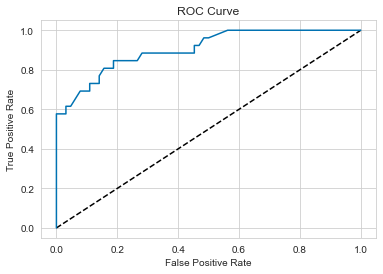

ROC AUC Score: 0.9047

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.83333333 0.78571429 0.80952381 0.80952381 0.95121951]

CV ROC AUC:
[0.85969388 0.83928571 0.89795918 0.85714286 0.94179894]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [139]:
#Code Block 120

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(random_state=1)

modeltraintest(vartrain, vartest, y_train, y_test, model)

In [140]:
#Code Block 121

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(random_state=1)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[61  3]
 [10 16]]

Accuracy Score: 0.8556
Recall Score: 0.6154
Precision Score: 0.8421
ROC AUC Score: 0.9047



### Fine-tune the model to find the OPTIMAL model
### Manually Setting the Properties for Random Forest

iteration 2 done. Accuracy = 0.8333333333333334
iteration 4 done. Accuracy = 0.8777777777777778
iteration 5 done. Accuracy = 0.8777777777777778
iteration 6 done. Accuracy = 0.8888888888888888
iteration 8 done. Accuracy = 0.8666666666666667
iteration 10 done. Accuracy = 0.8666666666666667
iteration 12 done. Accuracy = 0.8555555555555555
iteration 14 done. Accuracy = 0.8555555555555555
iteration 16 done. Accuracy = 0.8555555555555555
iteration 17 done. Accuracy = 0.8555555555555555
iteration 18 done. Accuracy = 0.8555555555555555
iteration 19 done. Accuracy = 0.8555555555555555
iteration 20 done. Accuracy = 0.8555555555555555
iteration 21 done. Accuracy = 0.8555555555555555
iteration 22 done. Accuracy = 0.8555555555555555
iteration 23 done. Accuracy = 0.8555555555555555
iteration 30 done. Accuracy = 0.8555555555555555


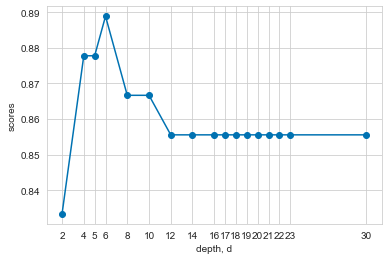

In [141]:
#Code Block 122

#depth = range(6,25)

#Chose to use a list instead of a rnage
depth = [2, 4, 5, 6, 8, 10, 12, 14, 16, 17, 18, 19, 20, 21, 22, 23, 30]

#Creates an empty list
scores = []

for d in depth:
    classifier = RandomForestClassifier(max_depth = d, random_state = 1)
    classifier = classifier.fit(X_train,y_train)
    score = classifier.score(X_test, y_test)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done. Accuracy = ".format(d) + str(score))


plt.plot(depth, scores, '-o')
plt.xlabel('depth, d')
plt.ylabel('scores')
plt.xticks(depth)
plt.show()

iteration 30 done. Accuracy = 0.8555555555555555
iteration 50 done. Accuracy = 0.8555555555555555
iteration 70 done. Accuracy = 0.8555555555555555
iteration 90 done. Accuracy = 0.8555555555555555
iteration 120 done. Accuracy = 0.8555555555555555
iteration 150 done. Accuracy = 0.8555555555555555
iteration 200 done. Accuracy = 0.8555555555555555
iteration 500 done. Accuracy = 0.8555555555555555


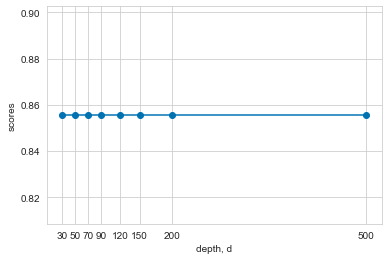

In [142]:
#Code Block 123

#depth = range(6,25)

#Chose to use a list instead of a rnage
depth = [30, 50, 70, 90, 120,150, 200, 500]

#Creates an empty list
scores = []

for d in depth:
    classifier = RandomForestClassifier(max_depth = d, random_state = 1)
    classifier = classifier.fit(X_train,y_train)
    score = classifier.score(X_test, y_test)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done. Accuracy = ".format(d) + str(score))


plt.plot(depth, scores, '-o')
plt.xlabel('depth, d')
plt.ylabel('scores')
plt.xticks(depth)
plt.show()

#### Max_depth of 4, 5, 6, and 8 have the highest accuracy score. We select Max_depth of 6 for now 

In [143]:
#Code Block 124

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(max_depth = 6, random_state=1)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[62  2]
 [ 8 18]]

Accuracy Score: 0.8889
Recall Score: 0.6923
Precision Score: 0.9000
ROC AUC Score: 0.9159



### Manually set Max Features


iteration 1 done. Accuracy = 0.8444444444444444
iteration 2 done. Accuracy = 0.8777777777777778
iteration 3 done. Accuracy = 0.8888888888888888
iteration 4 done. Accuracy = 0.8666666666666667
iteration 5 done. Accuracy = 0.8555555555555555
iteration 6 done. Accuracy = 0.8555555555555555
iteration 7 done. Accuracy = 0.8666666666666667
iteration 8 done. Accuracy = 0.8555555555555555
iteration 9 done. Accuracy = 0.8111111111111111
iteration 10 done. Accuracy = 0.8222222222222222
iteration 11 done. Accuracy = 0.8333333333333334
iteration 12 done. Accuracy = 0.8333333333333334


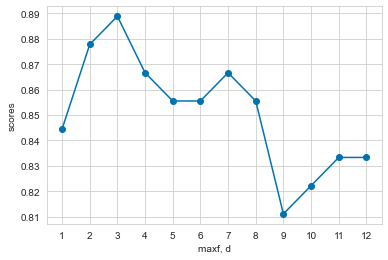

In [144]:
#Code Block 125


figsize=(20, 5)
maxf = range(1,13)
scores = []

for d in maxf:
    classifier=RandomForestClassifier(max_depth = 6, max_features = d, random_state=1)
    classifier=classifier.fit(X_train,y_train)
    score = classifier.score(X_test, y_test)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done. Accuracy = ".format(d) + str(score))


plt.plot(maxf, scores, '-o')
plt.xlabel('maxf, d')
plt.ylabel('scores')
plt.xticks(maxf)
plt.show()

### Select max_features = 2 as with this the accuracy score is the highest. It's possible to choose less max_features if the accuracy score is minimal difference.

iteration 1 done. Accuracy = 0.7666666666666667
iteration 20 done. Accuracy = 0.8555555555555555
iteration 50 done. Accuracy = 0.8777777777777778
iteration 100 done. Accuracy = 0.8888888888888888
iteration 150 done. Accuracy = 0.8888888888888888
iteration 500 done. Accuracy = 0.8666666666666667
iteration 700 done. Accuracy = 0.8777777777777778
iteration 1000 done. Accuracy = 0.8777777777777778


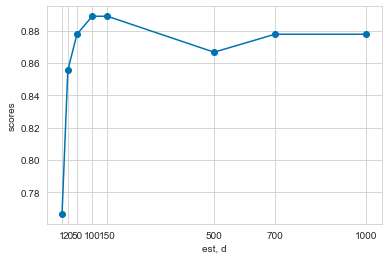

In [145]:
#Code Block 126

figsize=(20, 5)
est = [1, 20, 50, 100, 150, 500,700, 1000]
scores = []

for d in est:
    classifier=RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = d, random_state=1)
    classifier=classifier.fit(X_train,y_train)
    score = classifier.score(X_test, y_test)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done. Accuracy = ".format(d) + str(score))
#Manually set n_estimator

plt.plot(est, scores, '-o')
plt.xlabel('est, d')
plt.ylabel('scores')
plt.xticks(est)
plt.show()

### Random Forest with n_estimators = 50

In [146]:
#Code Block 127

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 50, random_state=1)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[63  1]
 [10 16]]

Accuracy Score: 0.8778
Recall Score: 0.6154
Precision Score: 0.9412
ROC AUC Score: 0.9044



### Random Forest with n_estimators = 100

In [147]:
#Code Block 128

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100, random_state=1)
shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[62  2]
 [ 8 18]]

Accuracy Score: 0.8889
Recall Score: 0.6923
Precision Score: 0.9000
ROC AUC Score: 0.9159



#### n_stimatores of 100  has the higher accuracy score than the 100. 

### Run Optimal Model with class_weight = None

In [148]:
#Code Block 129

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100, random_state=1, class_weight = None)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[62  2]
 [ 8 18]]

Accuracy Score: 0.8889
Recall Score: 0.6923
Precision Score: 0.9000
ROC AUC Score: 0.9159



### Use a For Loop to determine the optimal class_weight

In [149]:
#Code Block 130

cw = [None, 'balanced', {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4},
      {0:1, 1:4.5},{0:1, 1:5}, {0:1, 1:5.5}, {0:1, 1:6}, {0:1, 1:10}, 
      {0:1, 1:20}, {0:1, 1:25}, {0:1, 1:30}, {0:1, 1:50}, {0:1, 1:100}]

vartrain = X_train
vartest = X_test

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w) 
    varcw = w
    model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,random_state=1,
                                   class_weight=varcw)
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)


          
print('----------------------')



----------------------
Model with Class Weight: None

Confusion Matrix:
[[62  2]
 [ 8 18]]

Accuracy Score: 0.8889
Recall Score: 0.6923
Precision Score: 0.9000
ROC AUC Score: 0.9159

----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[60  4]
 [10 16]]

Accuracy Score: 0.8444
Recall Score: 0.6154
Precision Score: 0.8000
ROC AUC Score: 0.8948

----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[61  3]
 [ 9 17]]

Accuracy Score: 0.8667
Recall Score: 0.6538
Precision Score: 0.8500
ROC AUC Score: 0.9069

----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[61  3]
 [ 7 19]]

Accuracy Score: 0.8889
Recall Score: 0.7308
Precision Score: 0.8636
ROC AUC Score: 0.9141

----------------------
Model with Class Weight: {0: 1, 1: 3}

Confusion Matrix:
[[59  5]
 [ 7 19]]

Accuracy Score: 0.8667
Recall Score: 0.7308
Precision Score: 0.7917
ROC AUC Score: 0.9038

----------------------
Model with Class Weight: {0: 1, 

XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.877778

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[58  6]
 [ 5 21]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.92      0.91      0.91        64
           1       0.78      0.81      0.79        26

    accuracy                           0.88        90
   macro avg       0.85      0.86      0.85        90
weighted avg       0.88      0.88      0.88        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



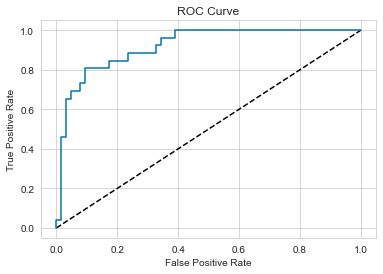

ROC AUC Score: 0.9189

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.85714286 0.73809524 0.80952381 0.76190476 0.85365854]

CV ROC AUC:
[0.82142857 0.84438776 0.91071429 0.85459184 0.92857143]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [150]:
#Code Block 131

vartrain = X_train
vartest = X_test
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100, class_weight = {0: 1, 1: 5})

modeltraintest(vartrain, vartest, y_train, y_test, model)

### Random Search for Random Forest

In [151]:
#Code Block 132

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV


In [152]:
#Code Block 133

vartrain = X_train
vartest = X_test

grid={"criterion": ['gini', 'entropy'], "max_depth" : [4, 5, 6],
      "n_estimators" : [20, 50, 100], "max_features" : [2, 3, 4],
      "class_weight": [None],
      "bootstrap": [True, False],
      "min_samples_split": [2, 5, 10]}
model_random = RandomForestClassifier(random_state = 1)
model_cv = RandomizedSearchCV(model_random,grid,cv = 5)
model_cv.fit(vartrain,y_train)

print("tuned hyperparameters :(best parameters) ",model_cv.best_params_)
print("accuracy :", model_cv.best_score_)

tuned hyperparameters :(best parameters)  {'n_estimators': 20, 'min_samples_split': 10, 'max_features': 3, 'max_depth': 5, 'criterion': 'entropy', 'class_weight': None, 'bootstrap': False}
accuracy : 0.8567944250871079


### Grid Search for Random Forest

In [153]:
#Code Block 134

vartrain = X_train
vartest = X_test

grid={"criterion": ['gini', 'entropy'], "max_depth" : [4, 5, 6],
      "n_estimators" : [20, 50, 100], "max_features" : [2, 3, 4],
      "class_weight": [None],
      "bootstrap": [True, False],
      "min_samples_split": [2, 5, 10]}
model_grid = RandomForestClassifier(random_state = 1, n_jobs = -2)
model_cv = GridSearchCV(model_grid,grid,cv = 5)
model_cv.fit(vartrain,y_train)

print("tuned hyperparameters :(best parameters) ",model_cv.best_params_)
print("accuracy :",model_cv.best_score_)

tuned hyperparameters :(best parameters)  {'bootstrap': False, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 4, 'max_features': 3, 'min_samples_split': 10, 'n_estimators': 100}
accuracy : 0.8567944250871079


In [155]:

#Code Block 135

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 4, max_features = 3, n_estimators = 100,
                               class_weight = None, criterion = 'entropy', random_state = 1,
                               bootstrap = False, min_samples_split = 10)
shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[61  3]
 [ 9 17]]

Accuracy Score: 0.8667
Recall Score: 0.6538
Precision Score: 0.8500
ROC AUC Score: 0.9008



In [156]:
#Code Block 136

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 4, max_features = 3, n_estimators = 100,
                               class_weight = None, criterion = 'entropy', random_state = 1,
                               bootstrap = True, min_samples_split = 10)
shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[63  1]
 [10 16]]

Accuracy Score: 0.8778
Recall Score: 0.6154
Precision Score: 0.9412
ROC AUC Score: 0.9062



In [157]:
#Code Block 137

cw = [None, 'balanced', {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4}, {0:1, 1:4.5},
      {0:1, 1:5},{0:1, 1:5.5}, {0:1, 1:6},{0:1, 1:6.5}, {0:1, 1:7}, {0:1, 1:7.5},{0:1, 1:8}, {0:1, 1:8.5}, 
      {0:1, 1:9},{0:1, 1:10}, {0:1, 1:11},{0:1, 1:12},{0:1, 1:13}]
    
vartrain = X_train
vartest = X_test

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w) 
    varcw = w
    #Set the model properties
    model = RandomForestClassifier(max_depth = 4, max_features = 3, n_estimators =100, 
                                   class_weight = varcw, criterion = 'gini', random_state=1,
                                   bootstrap = True, min_samples_split = 5)
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)

#run the model with the best parameters for different class_weights
          
print('----------------------')


----------------------
Model with Class Weight: None

Confusion Matrix:
[[63  1]
 [ 9 17]]

Accuracy Score: 0.8889
Recall Score: 0.6538
Precision Score: 0.9444
ROC AUC Score: 0.8972

----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[60  4]
 [ 8 18]]

Accuracy Score: 0.8667
Recall Score: 0.6923
Precision Score: 0.8182
ROC AUC Score: 0.8990

----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[60  4]
 [ 8 18]]

Accuracy Score: 0.8667
Recall Score: 0.6923
Precision Score: 0.8182
ROC AUC Score: 0.8954

----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[57  7]
 [ 8 18]]

Accuracy Score: 0.8333
Recall Score: 0.6923
Precision Score: 0.7200
ROC AUC Score: 0.9020

----------------------
Model with Class Weight: {0: 1, 1: 3}

Confusion Matrix:
[[56  8]
 [ 7 19]]

Accuracy Score: 0.8333
Recall Score: 0.7308
Precision Score: 0.7037
ROC AUC Score: 0.8996

----------------------
Model with Class Weight: {0: 1, 

In [158]:
#Code Block 138

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 4, max_features = 3, n_estimators =100, 
                               class_weight = None, criterion = 'gini', random_state=1,
                               bootstrap = True, min_samples_split = 5)

shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[63  1]
 [ 9 17]]

Accuracy Score: 0.8889
Recall Score: 0.6538
Precision Score: 0.9444
ROC AUC Score: 0.8972



- We want to have higher recall score then we sacrifice a little of accuracy to achieve that. We go back up to look at the different cws to find a good accuracy and recall scores. 

In [159]:
#Code Block 139

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)
                              
                              
                               
shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[56  8]
 [ 5 21]]

Accuracy Score: 0.8556
Recall Score: 0.8077
Precision Score: 0.7241
ROC AUC Score: 0.8960



XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.855556

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[56  8]
 [ 5 21]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.92      0.88      0.90        64
           1       0.72      0.81      0.76        26

    accuracy                           0.86        90
   macro avg       0.82      0.84      0.83        90
weighted avg       0.86      0.86      0.86        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



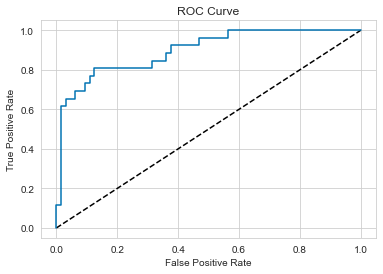

ROC AUC Score: 0.8960

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.85714286 0.80952381 0.78571429 0.78571429 0.87804878]

CV ROC AUC:
[0.8494898  0.86479592 0.9005102  0.85204082 0.91798942]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [160]:
#Code Block 140

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)
                               
modeltraintest(vartrain, vartest, y_train, y_test, model)

In [161]:
#Code Block 141

vartrain = X_train_sc
vartest = X_test_sc

model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)
                               
model.fit(vartrain, y_train)

model_pred = model.predict(vartest)
cm_dt_dec = pd.DataFrame(confusion_matrix(y_test, model_pred))

[Text(0, 0.5, 'Survived'), Text(0, 1.5, 'Dead')]

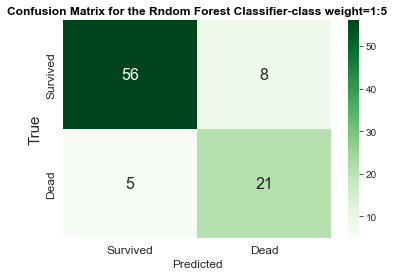

In [162]:
#Code Block 142

plt.title('Confusion Matrix for the Rndom Forest Classifier-class weight=1:5', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_dec, annot=True, cmap="Greens", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=12)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')



In [163]:
#Code Block 143

vartrain = X_train_sc
vartest = X_test_sc

model = RandomForestClassifier(max_depth = 4, max_features = 3, n_estimators = 100,
                               class_weight = None, criterion = 'gini', random_state = 1,
                               bootstrap = True, min_samples_split = 5)
    
model.fit(vartrain, y_train)

model_pred = model.predict(vartest)
cm_dt_opt = pd.DataFrame(confusion_matrix(y_test, model_pred))

[Text(0, 0.5, 'Survived'), Text(0, 1.5, 'Dead')]

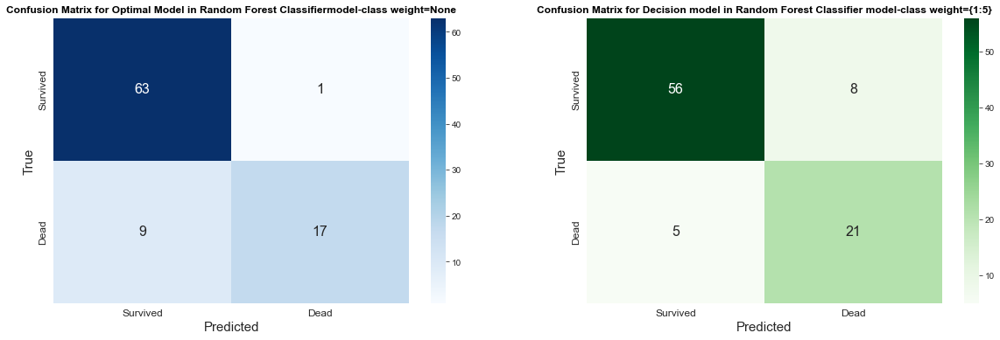

In [164]:
#Code Block 144

plt.figure(figsize=(20,6))

plt.subplot(121)

plt.title('Confusion Matrix for Optimal Model in Random Forest Classifiermodel-class weight=None', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_opt, annot=True, cmap="Blues", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')


plt.subplot(122)
plt.title('Confusion Matrix for Decision model in Random Forest Classifier model-class weight=''{1:5}', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_dec, annot=True, cmap="Greens", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')

##### Explanation:
- Our Decision Tree final model's parameters are max_depth = 6, max_features = 3, n_estimators = 100, class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1

In [165]:
#Code Block 145

vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)
                               
shorttraintest(vartrain, vartest, y_train, y_test, model)

Confusion Matrix:
[[56  8]
 [ 5 21]]

Accuracy Score: 0.8556
Recall Score: 0.8077
Precision Score: 0.7241
ROC AUC Score: 0.8960



### Importance Levels of the Variables


Text(0, 0.5, 'Variables')

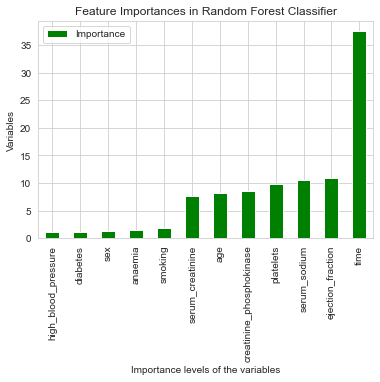

In [166]:
#Code Block 146

importance = pd.DataFrame({"Importance": model.feature_importances_ * 100},
                         index = pd.DataFrame(X_train).columns)
importance.sort_values(by = "Importance",
                       axis = 0,
                       ascending = True).plot(kind = "bar", color = "green")
plt.title('Feature Importances in Random Forest Classifier')
plt.xlabel("Importance levels of the variables")
plt.ylabel("Variables")

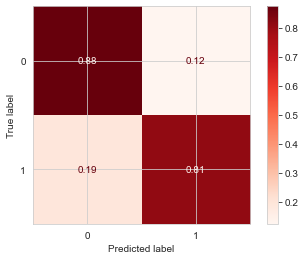

In [167]:
#Code Block 147

plot_confusion_matrix(model,
                      X_test,
                      y_test,
                      cmap = plt.cm.Reds,
                      normalize='true');

XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.855556

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[56  8]
 [ 5 21]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.92      0.88      0.90        64
           1       0.72      0.81      0.76        26

    accuracy                           0.86        90
   macro avg       0.82      0.84      0.83        90
weighted avg       0.86      0.86      0.86        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



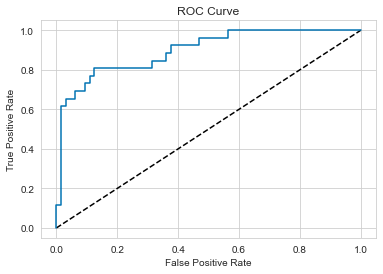

ROC AUC Score: 0.8960

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.85714286 0.80952381 0.78571429 0.78571429 0.87804878]

CV ROC AUC:
[0.8494898  0.86479592 0.9005102  0.85204082 0.91798942]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [168]:
#Code Block 148

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model = RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)
modeltraintest(vartrain, vartest, y_train, y_test, model)

### Explanation:
- The final  Random Forest model's parameters is max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1.  

## Classification using Decision Tree Modeling

### Run the Decision Tree model with default parameters

In [170]:
#Code Block 149

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 1)
#split X and y datasets

XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.877778

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[58  6]
 [ 5 21]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.92      0.91      0.91        64
           1       0.78      0.81      0.79        26

    accuracy                           0.88        90
   macro avg       0.85      0.86      0.85        90
weighted avg       0.88      0.88      0.88        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



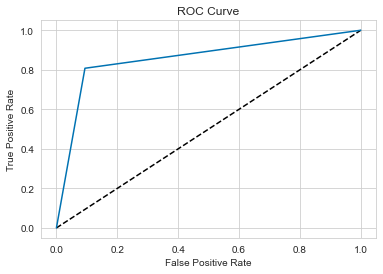

ROC AUC Score: 0.8570

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.76190476 0.71428571 0.78571429 0.71428571 0.75609756]

CV ROC AUC:
[0.75       0.64285714 0.73214286 0.66071429 0.74603175]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [171]:
#Code Block 150

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(random_state=1)  

modeltraintest(vartrain, vartest, y_train, y_test, model)

In [172]:
#Code Block 151

model = DecisionTreeClassifier(random_state=1)
model.fit(X_train, y_train)

model_pred = model.predict(X_test)

score = model.score(X_test, y_test)
print(score)
print("")
print(confusion_matrix(y_test, model_pred))

print(classification_report(y_test, model_pred))
#run the model

0.8777777777777778

[[58  6]
 [ 5 21]]
              precision    recall  f1-score   support

           0       0.92      0.91      0.91        64
           1       0.78      0.81      0.79        26

    accuracy                           0.88        90
   macro avg       0.85      0.86      0.85        90
weighted avg       0.88      0.88      0.88        90



### Visualize a Decision Tree

In [173]:
#Code Block 152

model
#show the model

DecisionTreeClassifier(random_state=1)

In [174]:
#Code Block 153

X_names=X_train.columns.values
#create a list of the column names

In [175]:
#Code Block 154

model = DecisionTreeClassifier(max_leaf_nodes=13, random_state = 1)
model.fit(X_train, y_train)
model_pred = model.predict(X_test)
model

DecisionTreeClassifier(max_leaf_nodes=13, random_state=1)

In [176]:
#Code Block 155

print(confusion_matrix(y_test, model_pred))

print(classification_report(y_test, model_pred))

[[56  8]
 [ 7 19]]
              precision    recall  f1-score   support

           0       0.89      0.88      0.88        64
           1       0.70      0.73      0.72        26

    accuracy                           0.83        90
   macro avg       0.80      0.80      0.80        90
weighted avg       0.84      0.83      0.83        90



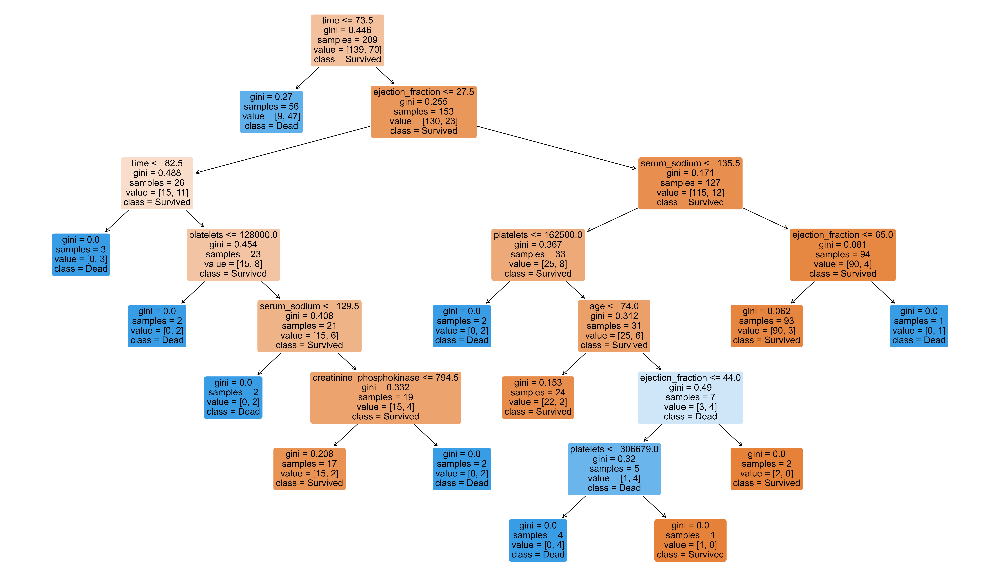

In [177]:
#Code Block 156

from sklearn import tree
#import tree from sklearn library

plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(27, 16), dpi=400)

plot_tree(model, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Survived", "Dead"], 
          feature_names=X_names); 
#create a decision tree

In [178]:
#Code Block 157

print(confusion_matrix(y_test, model_pred))

[[56  8]
 [ 7 19]]


### Using Decision Tree Modeling create a model using scaled data


XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.833333

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[56  8]
 [ 7 19]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.89      0.88      0.88        64
           1       0.70      0.73      0.72        26

    accuracy                           0.83        90
   macro avg       0.80      0.80      0.80        90
weighted avg       0.84      0.83      0.83        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



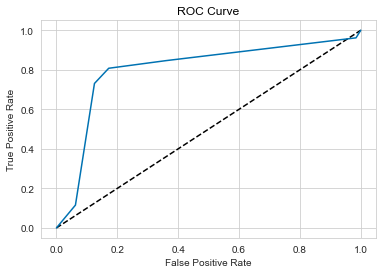

ROC AUC Score: 0.8014

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.73809524 0.80952381 0.78571429 0.73809524 0.7804878 ]

CV ROC AUC:
[0.74234694 0.76147959 0.75255102 0.65433673 0.74074074]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [179]:
#Code Block 158

#Set the X training and test datasets
vartrain = X_train_sc
vartest = X_test_sc

#Set the model properties
model = DecisionTreeClassifier(max_leaf_nodes=13, random_state = 1)

modeltraintest(vartrain, vartest, y_train, y_test, model)

XXXXXXXXXXXXXXXX ACCURACY SCORE XXXXXXXXXXXXXXXXXX
0.833333

XXXXXXXXXXXXXXXX CONFUSION MATRIX XXXXXXXXXXXXXXXX
[[56  8]
 [ 7 19]]

XXXXXXXXXXXXXX CLASSIFICATION REPORT XXXXXXXXXXXXXX
              precision    recall  f1-score   support

           0       0.89      0.88      0.88        64
           1       0.70      0.73      0.72        26

    accuracy                           0.83        90
   macro avg       0.80      0.80      0.80        90
weighted avg       0.84      0.83      0.83        90


XXXXXXXXXXXXXX ROC AUC SCORE AND CHART XXXXXXXXXXXXXXXXXX



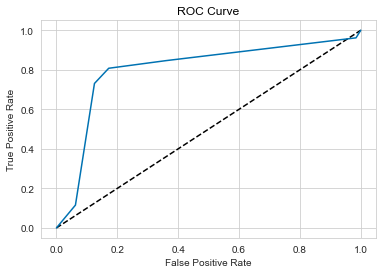

ROC AUC Score: 0.8014

XXXXXXXXXXXXXX CROSS VALIDATION XXXXXXXXXXXXXXXXXX

CV Accuracy Scores:
[0.73809524 0.80952381 0.78571429 0.73809524 0.7804878 ]

CV ROC AUC:
[0.74234694 0.76147959 0.75255102 0.65433673 0.74074074]

XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX


In [180]:
#Code Block 159

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_leaf_nodes=13, random_state = 1)

modeltraintest(vartrain, vartest, y_train, y_test, model)

#### Explanation:
- Standard Scaled data doesn't perform as well as raw data and decision tree classifiers work better with the raw data. So, we use raw data for OPTIMAL and DECISION. 
- Just with setting the max_leaf_nodes=13 we got an accuracy sore of 0.83

### Fine-tune the model to find the OPTIMAL model
#### Manually Setting the Properties for Decision Tree

iteration 1 done
iteration 2 done
iteration 3 done
iteration 4 done
iteration 5 done
iteration 6 done
iteration 7 done
iteration 8 done
iteration 9 done
iteration 10 done
iteration 11 done
iteration 12 done
iteration 13 done
iteration 14 done
iteration 15 done
iteration 16 done
iteration 17 done
iteration 18 done
iteration 19 done


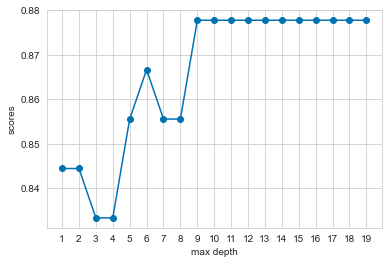

In [181]:
#Code Block 160

est = range(1,20)
scores = []
var_est = 'max depth'

for d in est:
    classifier=DecisionTreeClassifier(max_depth = d, random_state = 1)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(est, scores, '-o')
plt.xlabel(var_est)
plt.ylabel('scores')
plt.xticks(est)
plt.show()
#show the scores for max_depth range in a plot 

iteration 20 done
iteration 21 done
iteration 22 done
iteration 23 done
iteration 24 done
iteration 25 done
iteration 26 done
iteration 27 done
iteration 28 done
iteration 29 done
iteration 30 done
iteration 31 done
iteration 32 done
iteration 33 done
iteration 34 done
iteration 35 done
iteration 36 done
iteration 37 done
iteration 38 done
iteration 39 done


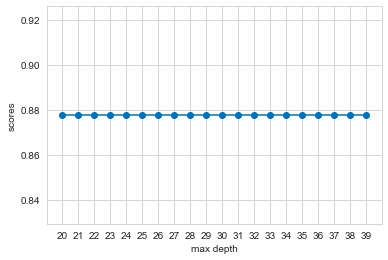

In [182]:
#Code Block 161

est = range(20,40)
scores = []
var_est = 'max depth'

for d in est:
    classifier=DecisionTreeClassifier(max_depth = d, random_state = 1)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(est, scores, '-o')
plt.xlabel(var_est)
plt.ylabel('scores')
plt.xticks(est)
plt.show()
#show the scores for max_depth range in a plot 

iteration 40 done
iteration 41 done
iteration 42 done
iteration 43 done
iteration 44 done
iteration 45 done
iteration 46 done
iteration 47 done
iteration 48 done
iteration 49 done
iteration 50 done
iteration 51 done
iteration 52 done
iteration 53 done
iteration 54 done
iteration 55 done
iteration 56 done
iteration 57 done
iteration 58 done
iteration 59 done


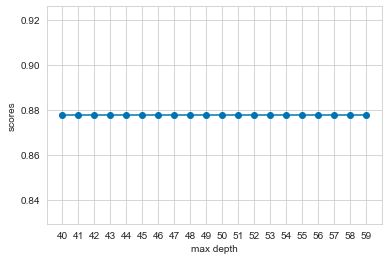

In [183]:
#Code Block 162

est = range(40,60)
scores = []
var_est = 'max depth'

for d in est:
    classifier=DecisionTreeClassifier(max_depth = d, random_state = 1)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(est, scores, '-o')
plt.xlabel(var_est)
plt.ylabel('scores')
plt.xticks(est)
plt.show()
#show the scores for max_depth range in a plot 

#### We see the max score for max_depth  2 and 3

In [184]:
#Code Block 163

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_depth=9, random_state = 1)

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model based on max_depth = 4

Confusion Matrix:
[[58  6]
 [ 5 21]]

Accuracy Score: 0.8778
Recall Score: 0.8077
Precision Score: 0.7778
ROC AUC Score: 0.8570



iteration 9 done
iteration 10 done
iteration 11 done
iteration 12 done
iteration 13 done
iteration 14 done
iteration 15 done
iteration 16 done
iteration 17 done
iteration 18 done
iteration 19 done
iteration 20 done
iteration 21 done
iteration 22 done
iteration 23 done
iteration 24 done
iteration 25 done
iteration 26 done
iteration 27 done
iteration 28 done
iteration 29 done


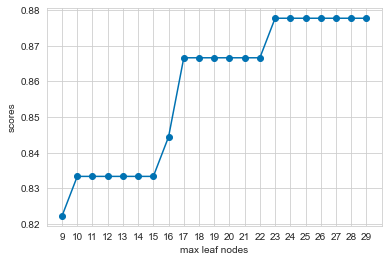

In [185]:
#Code Block 164

figsize=(20, 6)
est = range(9, 30)
scores = []
var_est = 'max leaf nodes'

for d in est:
    classifier=DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = d, random_state = 1)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(est, scores, '-o')
plt.xlabel(var_est)
plt.ylabel('scores')
plt.xticks(est)
plt.show()
##show the scores for max leaf nodes range (9,30) in a plot 

iteration 30 done
iteration 31 done
iteration 32 done
iteration 33 done
iteration 34 done
iteration 35 done
iteration 36 done
iteration 37 done
iteration 38 done
iteration 39 done
iteration 40 done
iteration 41 done
iteration 42 done
iteration 43 done
iteration 44 done
iteration 45 done
iteration 46 done
iteration 47 done
iteration 48 done
iteration 49 done


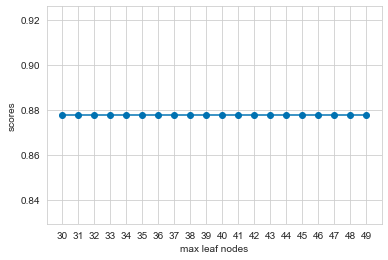

In [186]:
#Code Block 165

figsize=(20, 5)
est = range(30, 50)
scores = []
var_est = 'max leaf nodes'

for d in est:
    classifier=DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = d, random_state = 1)
    classifier=classifier.fit(X_train,y_train)
    scores.append(classifier.score(X_test, y_test))
    print("iteration {} done".format(d))


plt.plot(est, scores, '-o')
plt.xlabel(var_est)
plt.ylabel('scores')
plt.xticks(est)
plt.show()
##show the scores for max leaf nodes range (9,30) in a plot 

In [187]:
#Code Block 166

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 23, class_weight=None, random_state = 1)
#set max_depth = 9 and max_leaf_nodes = 23

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model with the new parameters 

Confusion Matrix:
[[59  5]
 [ 6 20]]

Accuracy Score: 0.8778
Recall Score: 0.7692
Precision Score: 0.8000
ROC AUC Score: 0.8224



### Checking our model with different class_weight

In [188]:
#Code Block 167

cw = [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4},
     {0:1, 1:4.5}, {0:1, 1:5}, {0:1, 1:6}, {0:1, 1:8}, {0:1, 1:10}, {0:1, 1:11}, {0:1, 1:12},
      {0:1, 1:13}, {0:1, 1:14},{0:1, 1:15}, {0:1, 1:18}, {0:1, 1:20}]

vartrain = X_train
vartest = X_test

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w) 
    varcw = w
    model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes =23, class_weight=varcw, random_state = 1)
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)


          
print('----------------------')



----------------------
Model with Class Weight: None

Confusion Matrix:
[[59  5]
 [ 6 20]]

Accuracy Score: 0.8778
Recall Score: 0.7692
Precision Score: 0.8000
ROC AUC Score: 0.8224

----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[55  9]
 [ 9 17]]

Accuracy Score: 0.8000
Recall Score: 0.6538
Precision Score: 0.6538
ROC AUC Score: 0.6989

----------------------
Model with Class Weight: {0: 1, 1: 1.5}

Confusion Matrix:
[[54 10]
 [ 6 20]]

Accuracy Score: 0.8222
Recall Score: 0.7692
Precision Score: 0.6667
ROC AUC Score: 0.7043

----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[51 13]
 [ 2 24]]

Accuracy Score: 0.8333
Recall Score: 0.9231
Precision Score: 0.6486
ROC AUC Score: 0.8353

----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[51 13]
 [ 2 24]]

Accuracy Score: 0.8333
Recall Score: 0.9231
Precision Score: 0.6486
ROC AUC Score: 0.8353

----------------------
Model with Class Weight: {0: 1

### Grid Search for Decision Tree

In [189]:
#Code Block 168

from sklearn.model_selection import GridSearchCV


grid={"criterion": ['gini', 'entropy'], "max_depth" : range(9,19),
      "max_leaf_nodes" : range(22,29),
      "class_weight": [None, 'balanced',{0:1, 1:2}, {0:1, 1:2.5}, {0:1, 1:3}, {0:1, 1:3.5},
                       {0:1, 1:10}, {0:1, 1:11}, {0:1, 1:12}]}
model_random = DecisionTreeClassifier(random_state = 1)
model_cv=GridSearchCV(model_random,grid,cv=5)
model_cv.fit(vartrain,y_train)


print("tuned hyperparameters :(best parameters) ",model_cv.best_params_)
print("accuracy :",model_cv.best_score_)

tuned hyperparameters :(best parameters)  {'class_weight': {0: 1, 1: 11}, 'criterion': 'entropy', 'max_depth': 9, 'max_leaf_nodes': 26}
accuracy : 0.8184668989547038


### Running Decision Tree model with best parameters

Confusion Matrix:
[[54 10]
 [ 7 19]]

Accuracy Score: 0.8111
Recall Score: 0.7308
Precision Score: 0.6552


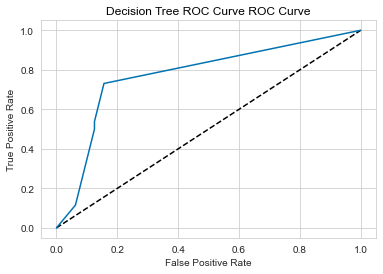

In [190]:
#Code Block 169

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model_dt = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 26, 
                               class_weight={0: 1, 1: 11}, criterion = 'entropy', random_state = 1)

#Assess with the model
model_dt.fit(vartrain, y_train)

#Predict with the model
model_pred = model_dt.predict(vartest)
model_prob = model_dt.predict_proba(vartest)


print('Confusion Matrix:')
cm_dt = confusion_matrix(y_test, model_pred)
print(cm_dt)
print("")

#Assess with the model
score = model_dt.score(vartest, y_test)
score_format = 'Accuracy Score: {0:.4f}'.format(score)
print(score_format)

recall = recall_score(y_test, model_pred)
recall_format = 'Recall Score: {0:.4f}'.format(recall)
print(recall_format)

precision = precision_score(y_test, model_pred)
precision_format = 'Precision Score: {0:.4f}'.format(precision)
print(precision_format)

y_pred_prob = model_dt.predict_proba(vartest)[:,1]

dt_fpr, dt_tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(dt_fpr, dt_tpr, label='Decision Tree')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree ROC Curve ROC Curve')
plt.show();


In [191]:
#Code Block 170

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 26, class_weight={0:1, 1:11},
                               criterion = 'entropy', random_state = 1)
#set max_depth = 2 and max_leaf_nodes = 9 

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model with the new parameters 

Confusion Matrix:
[[54 10]
 [ 7 19]]

Accuracy Score: 0.8111
Recall Score: 0.7308
Precision Score: 0.6552
ROC AUC Score: 0.7728



In [192]:
#Code Block 171

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes =23, class_weight={0:1, 1:11},
                               criterion = 'gini', random_state = 1)
#set max_depth = 4 and max_leaf_nodes = 9 

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model with the new parameters 

Confusion Matrix:
[[55  9]
 [ 5 21]]

Accuracy Score: 0.8444
Recall Score: 0.8077
Precision Score: 0.7000
ROC AUC Score: 0.8371



### Fine-tune the model to find the DECISION model


In [193]:
#Code Block 172

cw = [None, 'balanced', {0:1, 1:1.5}, {0:1, 1:2}, {0:1, 1:2.5},{0:1, 1:2.6},{0:1, 1:2.65},{0:1, 1:12.7},{0:1, 1:2.75},{0:1, 1:3}, {0:1, 1:3.5}, {0:1, 1:4},
      {0:1, 1:4.5}, {0:1, 1:5}, {0:1, 1:10},{0:1, 1:11}, {0:1, 1:12},{0:1, 1:13}, {0:1, 1:16.5},{0:1, 1:17},
      {0:1, 1:17.5},{0:1, 1:18}]

vartrain = X_train
vartest = X_test

for w in cw:
    print('----------------------')
    vartitle = "Model with Class Weight: " + str(w) 
    varcw = w
    #Set the model properties
    model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 23, 
                               class_weight=varcw, criterion = 'gini', random_state = 1)
    #Assess with the model
    print(vartitle)
    print('')
    shorttraintest(vartrain, vartest, y_train, y_test, model)


          
print('----------------------')


----------------------
Model with Class Weight: None

Confusion Matrix:
[[59  5]
 [ 6 20]]

Accuracy Score: 0.8778
Recall Score: 0.7692
Precision Score: 0.8000
ROC AUC Score: 0.8224

----------------------
Model with Class Weight: balanced

Confusion Matrix:
[[55  9]
 [ 9 17]]

Accuracy Score: 0.8000
Recall Score: 0.6538
Precision Score: 0.6538
ROC AUC Score: 0.6989

----------------------
Model with Class Weight: {0: 1, 1: 1.5}

Confusion Matrix:
[[54 10]
 [ 6 20]]

Accuracy Score: 0.8222
Recall Score: 0.7692
Precision Score: 0.6667
ROC AUC Score: 0.7043

----------------------
Model with Class Weight: {0: 1, 1: 2}

Confusion Matrix:
[[51 13]
 [ 2 24]]

Accuracy Score: 0.8333
Recall Score: 0.9231
Precision Score: 0.6486
ROC AUC Score: 0.8353

----------------------
Model with Class Weight: {0: 1, 1: 2.5}

Confusion Matrix:
[[51 13]
 [ 2 24]]

Accuracy Score: 0.8333
Recall Score: 0.9231
Precision Score: 0.6486
ROC AUC Score: 0.8353

----------------------
Model with Class Weight: {0: 1

### Explanation : Model with Class Weight: {0: 1, 1: 3} works good as it gives us an accuracy score of 0.7889 and Recall score of 0.8108. Optimal and Decision model are the same here. 

Confusion Matrix:
[[55  9]
 [ 5 21]]

Accuracy Score: 0.8444
Recall Score: 0.8077
Precision Score: 0.7000


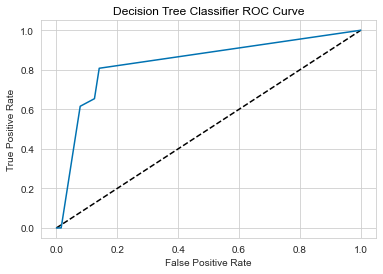

In [194]:
#Code Block 173

#Set the X training and test datasets
vartrain = X_train
vartest = X_test

#Set the model properties
model_dt_10 = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 23, 
                               class_weight={0: 1, 1: 10}, criterion = 'gini', random_state = 1)

#Assess with the model
model_dt_10.fit(vartrain, y_train)

#Predict with the model
model_pred = model_dt_10.predict(vartest)
model_prob = model_dt_10.predict_proba(vartest)


print('Confusion Matrix:')
cm_dt_10 = confusion_matrix(y_test, model_pred)
print(cm_dt_10)
print("")

#Assess with the model
score = model_dt_10.score(vartest, y_test)
score_format = 'Accuracy Score: {0:.4f}'.format(score)
print(score_format)

recall = recall_score(y_test, model_pred)
recall_format = 'Recall Score: {0:.4f}'.format(recall)
print(recall_format)

precision = precision_score(y_test, model_pred)
precision_format = 'Precision Score: {0:.4f}'.format(precision)
print(precision_format)

y_pred_prob = model_dt_10.predict_proba(vartest)[:,1]

dt_10_fpr, dt_10_tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1],'k--')
plt.plot(dt_10_fpr, dt_10_tpr, label='Decision Tree ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Decision Tree Classifier ROC Curve')
plt.show();

In [195]:
#Code Block 174

vartrain = X_train
vartest = X_test
model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes =23, class_weight={0:1, 1:10},
                               criterion = 'gini', random_state = 1)
#set max_depth = 4 and max_leaf_nodes = 9 

shorttraintest(vartrain, vartest, y_train, y_test, model)
#run the model with the new parameters 

Confusion Matrix:
[[55  9]
 [ 5 21]]

Accuracy Score: 0.8444
Recall Score: 0.8077
Precision Score: 0.7000
ROC AUC Score: 0.8371



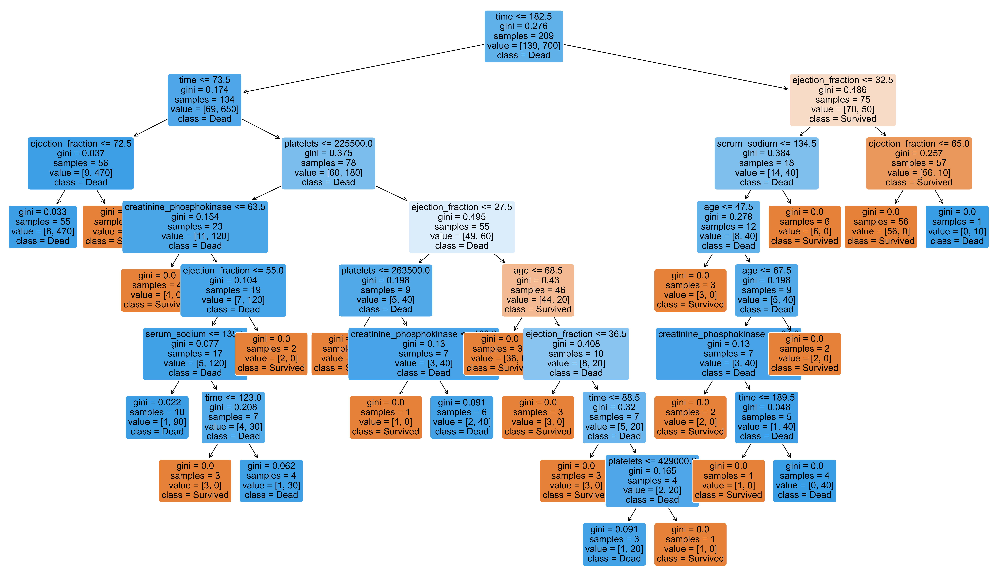

In [196]:
#Code Block 175

from sklearn import tree

plt.rcParams['text.color'] = 'black'
plt.figure(figsize=(27, 16), dpi=400)

plot_tree(model, 
          filled=True, 
          rounded=True,
          fontsize=14,
          proportion=False,
          class_names=["Survived", "Dead"], 
          feature_names=X_names); 

In [197]:
#Code Block 176

vartrain = X_train_sc
vartest = X_test_sc

model = DecisionTreeClassifier(max_depth = 9, max_leaf_nodes = 23, 
                               class_weight=None, criterion = 'gini', random_state = 1)
model.fit(vartrain, y_train)

model_pred = model.predict(vartest)

cm_dt_opt = pd.DataFrame(confusion_matrix(y_test, model_pred))
#crete a confusion matrix dataframe for optimal model

[Text(0, 0.5, 'Survived'), Text(0, 1.5, 'Dead')]

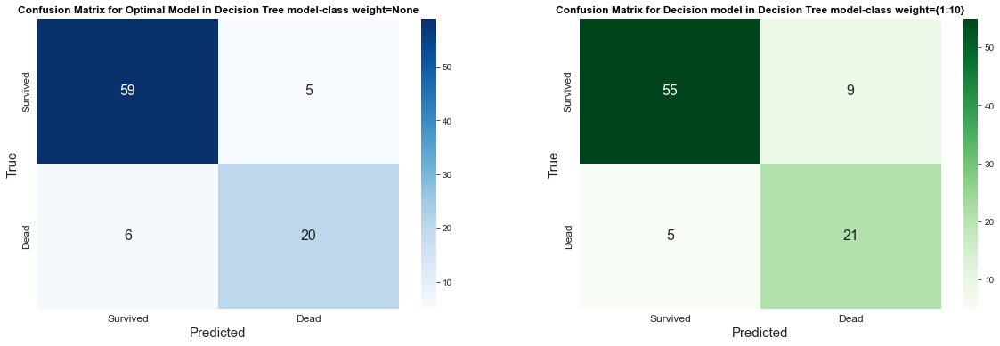

In [198]:
#Code Block 177

plt.figure(figsize=(20,6))

plt.subplot(121)

plt.title('Confusion Matrix for Optimal Model in Decision Tree model-class weight=None', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_opt, annot=True, cmap="Blues", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')


plt.subplot(122)
plt.title('Confusion Matrix for Decision model in Decision Tree model-class weight=''{1:10}', fontweight='bold', color = 'black', fontsize='12', horizontalalignment='center')
chart = sns.heatmap(cm_dt_10, annot=True, cmap="Greens", annot_kws={"size": 16}, fmt="g")
chart.set_xlabel('Predicted', fontsize=15)
chart.set_ylabel('True', fontsize=15)
chart.xaxis.set_ticklabels(["Survived", "Dead"], fontsize=12)
chart.yaxis.set_ticklabels(["Survived", "Dead"], fontsize=12, va='center')

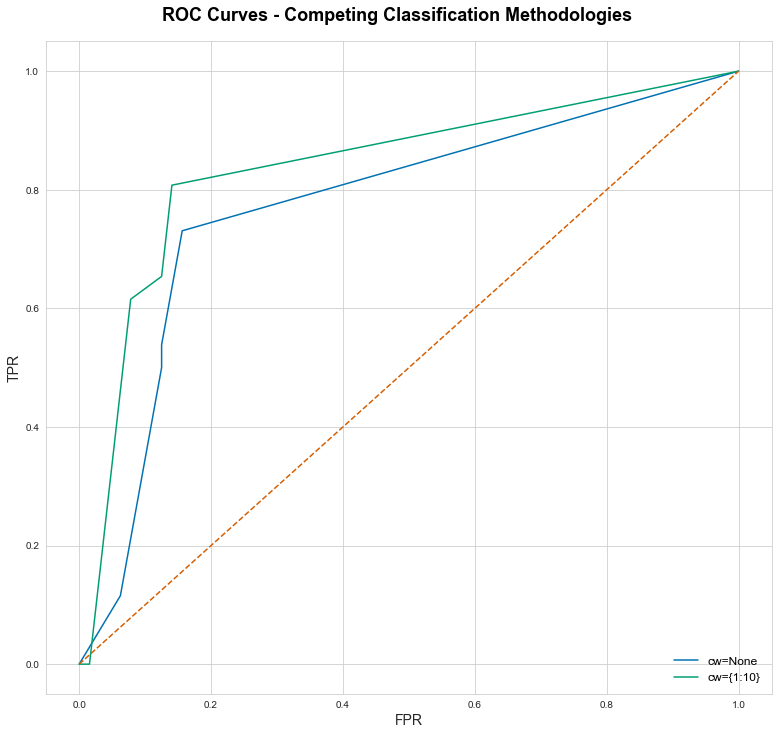

In [199]:
#Code Block 178

# Create Overall ROC Curve 
plt.figure(figsize = (13,12))
plt.suptitle('ROC Curves - Competing Classification Methodologies', fontweight='bold', fontsize=18, y=.92)
plt.plot(dt_fpr, dt_tpr, label='cw=None')
plt.plot(dt_10_fpr, dt_10_tpr, label='cw={1:10}')
plt.plot([0,1], [0,1], linestyle='--')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('FPR', fontsize=14)
plt.ylabel('TPR', fontsize=14)
plt.legend(loc="lower right", frameon=False, fontsize=12)
plt.show()

- The orange on with cw ={1:10} seems the best.

In [200]:
#Code Block 179

model_pred = pd.DataFrame(model_pred)
#create a dataframe for model_pred

model_pred = model_pred.rename(columns = {0:'Pred_DEC_dt'})
#rename column
model_pred.head()

,Pred_DEC_dt
0,0
1,0
2,1
3,0
4,0


In [201]:
#Code Block 180

X_names = pd.DataFrame(list(X.columns))

In [202]:
#Code Block 181

df_fi = pd.DataFrame(model_dt.feature_importances_)
#create a dataframe for feature importance for OPTICAL model
df_fi

,0
0,0.136750
1,0.000000
2,0.151001
3,0.000000
4,0.103104
5,0.000000
6,0.069363
7,0.035984
8,0.016060
9,0.000000


In [203]:
#Code Block 182

df_fi_10 = pd.DataFrame(model_dt_10.feature_importances_)
#create a dataframe for feature importance for DECISION model

In [204]:
#Code Block 183

df_feat_imp = pd.concat([X_names, df_fi, df_fi_10], axis = 1)
#concatenate X_names, df_fi, and df_fi_10 to create a feature importance table 
df_feat_imp.columns = ['Features', 'dt_importance', 'dt_10_importance']
#create name of the columns for feature importance table 
df_feat_imp

,Features,dt_importance,dt_10_importance
0,age,0.136750,0.115321
1,anaemia,0.000000,0.000000
2,creatinine_phosphokinase,0.151001,0.059668
3,diabetes,0.000000,0.000000
4,ejection_fraction,0.103104,0.310457
5,high_blood_pressure,0.000000,0.000000
6,platelets,0.069363,0.101371
7,serum_creatinine,0.035984,0.000000
8,serum_sodium,0.016060,0.038583
9,sex,0.000000,0.000000


### Shows all features that are above 0

In [205]:
#Code Block 184

df_feat_imp[(df_feat_imp['dt_10_importance']!=0)].sort_values('dt_10_importance', ascending = False)

,Features,dt_importance,dt_10_importance
11,time,0.470352,0.374600
4,ejection_fraction,0.103104,0.310457
0,age,0.136750,0.115321
6,platelets,0.069363,0.101371
2,creatinine_phosphokinase,0.151001,0.059668
8,serum_sodium,0.016060,0.038583


In [206]:
#Code Block 185

df_feat_imp1 = pd.concat([X_names, df_fi_10], axis = 1)
#concatenate X_names and df_fi_2 to create a feature importance table 
df_feat_imp1.columns = ['Features','dt_10_importance']
#create name of the columns for feature importance table 
df_feat_imp1

,Features,dt_10_importance
0,age,0.115321
1,anaemia,0.000000
2,creatinine_phosphokinase,0.059668
3,diabetes,0.000000
4,ejection_fraction,0.310457
5,high_blood_pressure,0.000000
6,platelets,0.101371
7,serum_creatinine,0.000000
8,serum_sodium,0.038583
9,sex,0.000000


In [207]:
#Code Block 186

df_feat_imp1[(df_feat_imp1['dt_10_importance']!=0)].sort_values('dt_10_importance', ascending = False)

,Features,dt_10_importance
11,time,0.374600
4,ejection_fraction,0.310457
0,age,0.115321
6,platelets,0.101371
2,creatinine_phosphokinase,0.059668
8,serum_sodium,0.038583


Text(0, 0.5, 'Variables')

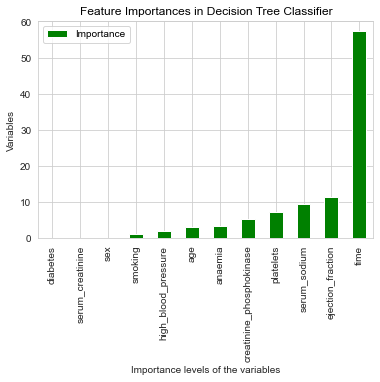

In [208]:
#Code Block 187

importance = pd.DataFrame({"Importance": model.feature_importances_ * 100},
                         index = pd.DataFrame(X_train).columns)
importance.sort_values(by = "Importance",
                       axis = 0,
                       ascending = True).plot(kind = "bar", color = "green")
plt.title('Feature Importances in Decision Tree Classifier')
plt.xlabel("Importance levels of the variables")
plt.ylabel("Variables")

In [209]:
#Code Block 188

model = [
         
#Logistic Regression 
        
         (X_train_sc, X_test_sc, y_train,'Logistic',
          LogisticRegression(random_state = 1, C = 0.1, class_weight =None, penalty = 'l1', solver = 'liblinear')),
        
         
#Decision Tree 
        
         (X_train, X_test, y_train,'DecisionTree',
          DecisionTreeClassifier(max_depth = 9, max_leaf_nodes =23, class_weight={0:1, 1:10},
                               criterion = 'gini', random_state = 1)),
         

#Random Forest 
    
         (X_train, X_test, y_train, 'RandomForest',
          RandomForestClassifier(max_depth = 6, max_features = 3, n_estimators = 100,
                               class_weight = {0: 1, 1: 5}, criterion = 'gini', random_state = 1)),
]         
         
          
cm_all = pd.DataFrame(columns=['Type', 'pred_survived', 'pred_dead','Score', 'Recall', 'Precision','F1'])
#create a new dataframe with above columns 


for tr, tst, yt, n, m in model:
    m.fit(tr, yt)
    model_pred = m.predict(tst)
    model_prob = m.predict_proba(tst)
    score = m.score(tst, y_test)
    score_format = '{0:.4f}'.format(score)
    
    recall = recall_score(y_test, model_pred)
    recall_format = '{0:.4f}'.format(recall)
    
    f1 = f1_score(y_test, model_pred)
    f1_format = '{0:.4f}'.format(f1) 
    
    precision = precision_score(y_test, model_pred)
    precision_format = '{0:.4f}'.format(precision)
    
    y_pred_prob = m.predict_proba(tst)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    exec(f'fpr_{n} = fpr')
    exec(f'tpr_{n} = tpr')
    exec(f'thresholds_{n} = thresholds')
    exec(f'{n} = n')

    cm = pd.DataFrame(confusion_matrix(y_test, model_pred))
    cm=cm.rename(columns = {0:'pred_survived', 1:'pred_dead'})
    
    exec(f'cm_{n} = cm')
    cm['Type'] = n
    cm['Score'] = score_format
    cm['Recall'] = recall_format
    cm['Precision'] = precision_format
    cm['F1'] = f1_format
    cm_all = pd.concat([cm_all, cm], axis=0)
    print(n + " - Score: " + str(score_format) + " - Recall: " +
    str(recall_format) + " - Precision: " + str(precision_format) + " - F1: " +
    str(f1_format))
    print('----------------------------------------------------------------')


cm_all = cm_all.reset_index()
cm_all['index'] = np.where(cm_all['index']==0, 'Survived', 'Dead')
cm_all = cm_all.rename(columns={'index':'actual'})

display(cm_all)

print('--------------------------------------------------------------------')


Logistic - Score: 0.8333 - Recall: 0.6923 - Precision: 0.7200 - F1: 0.7059
----------------------------------------------------------------
DecisionTree - Score: 0.8444 - Recall: 0.8077 - Precision: 0.7000 - F1: 0.7500
----------------------------------------------------------------
RandomForest - Score: 0.8556 - Recall: 0.8077 - Precision: 0.7241 - F1: 0.7636
----------------------------------------------------------------


,actual,Type,pred_survived,pred_dead,Score,Recall,Precision,F1
0,Survived,Logistic,57,7,0.8333,0.6923,0.7200,0.7059
1,Dead,Logistic,8,18,0.8333,0.6923,0.7200,0.7059
2,Survived,DecisionTree,55,9,0.8444,0.8077,0.7000,0.7500
3,Dead,DecisionTree,5,21,0.8444,0.8077,0.7000,0.7500
4,Survived,RandomForest,56,8,0.8556,0.8077,0.7241,0.7636
5,Dead,RandomForest,5,21,0.8556,0.8077,0.7241,0.7636


--------------------------------------------------------------------


In [211]:
fpr_Logistic

array([0.      , 0.      , 0.      , 0.015625, 0.015625, 0.03125 ,
       0.03125 , 0.046875, 0.046875, 0.09375 , 0.09375 , 0.109375,
       0.109375, 0.1875  , 0.1875  , 0.296875, 0.296875, 0.3125  ,
       0.3125  , 0.328125, 0.328125, 0.34375 , 0.34375 , 0.46875 ,
       0.46875 , 0.59375 , 0.59375 , 1.      ])

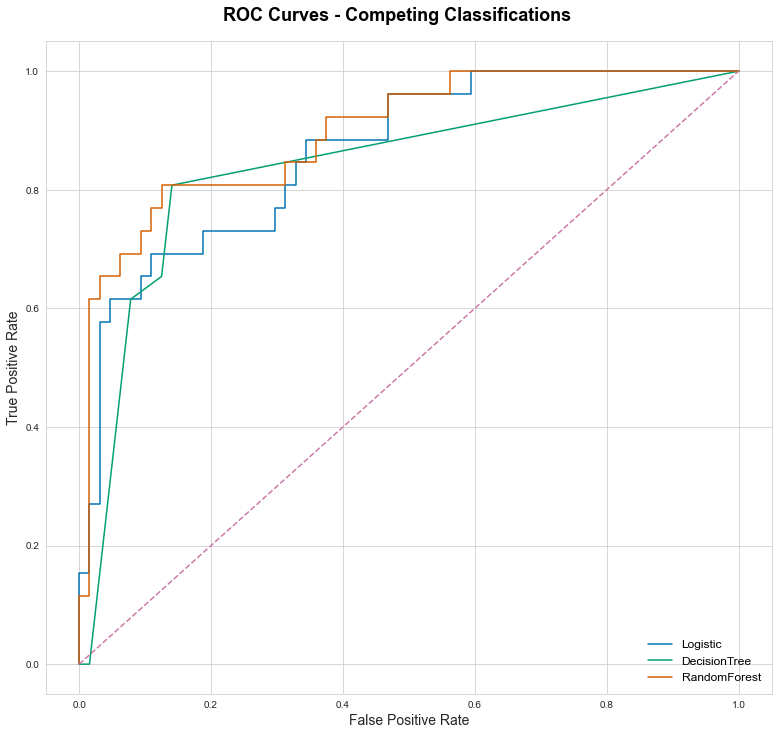

In [212]:
#Code Block 189

# Create Overall ROC Curve 
plt.figure(figsize = (13,12))
plt.suptitle('ROC Curves - Competing Classifications', fontweight='bold', fontsize=18, y=.92)
plt.plot(fpr_Logistic, tpr_Logistic, label='Logistic')
plt.plot(fpr_DecisionTree, tpr_DecisionTree, label='DecisionTree')
plt.plot(fpr_RandomForest, tpr_RandomForest, label='RandomForest')

plt.plot([0,1], [0,1], linestyle='--')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.legend(loc="lower right", frameon=False, fontsize=12)
plt.show()

### Explanation: 
- The above graph shows random forest model performs better among all models in this project. 

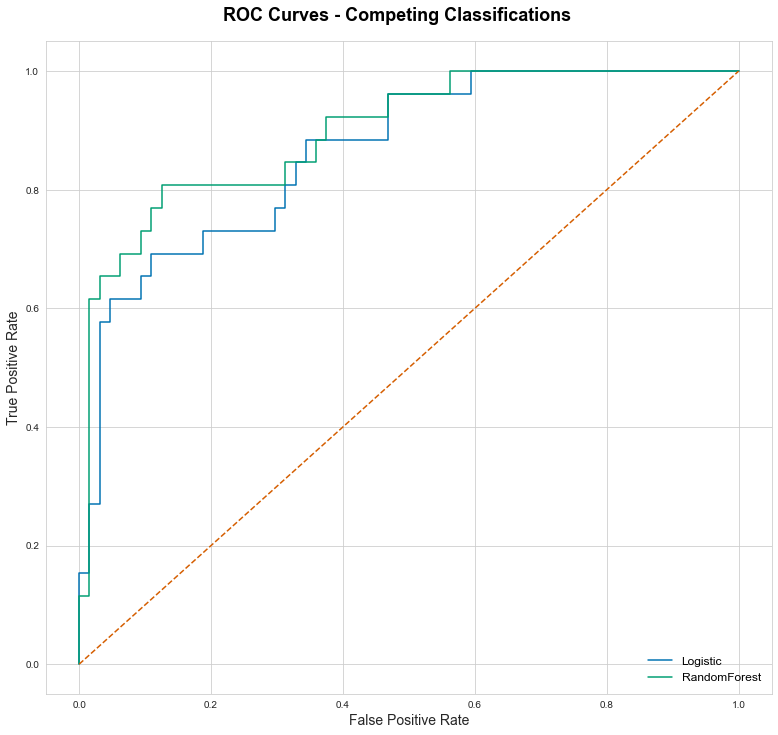

In [213]:
#Code Block 190

# Create Overall ROC Curve 
plt.figure(figsize = (13,12))
plt.suptitle('ROC Curves - Competing Classifications', fontweight='bold', fontsize=18, y=.92)
plt.plot(fpr_Logistic, tpr_Logistic, label='Logistic')
plt.plot(fpr_RandomForest, tpr_RandomForest, label='RandomForest')

plt.plot([0,1], [0,1], linestyle='--')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.legend(loc="lower right", frameon=False, fontsize=12)
plt.show()